# Setup

In [65]:
import numpy as np
import matplotlib.pyplot as plt
# from pycqed.analysis_v2.base_analysis import BaseDataAnalysis
from pycqed.analysis import analysis_toolbox as a_tools
from pycqed.analysis_v2 import readout_analysis as ra
import os
import matplotlib
import matplotlib.colors as mc
import itertools
from sklearn.metrics import confusion_matrix
from sklearn.mixture import GaussianMixture as GM
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from importlib import reload
import datetime
import h5py

# matplotlib.rcParams.update({'font.size': 20})
a_tools.datadir = "Q://USERS//nathan//data/thesis_data"
figsave_base = "C:\\Users\\nathan\\projects\\master_thesis\\appendices\\qutrit_readout\\figs\\"

In [10]:
def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          normalize=True):
    fidelity_avg = np.trace(cm) / float(np.sum(cm))

    if cmap is None:
        cmap = plt.get_cmap('coolwarm')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap, norm=mc.LogNorm())
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j,
                     i,
                     "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j,
                     i,
                     "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('Prepared State')
    plt.xlabel('Predicted State\n$\mathcal{{F}}_{{avg}}$={:0.2f} %'.format(
        fidelity_avg * 100))
    plt.show()


# create own colormap
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = matplotlib.colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap


cmap = plt.get_cmap('tab10')
tab3 = truncate_colormap(cmap, 0, 0.299)

# arr = np.linspace(0, 50, 100).reshape((10, 10))
# fig, ax = plt.subplots(ncols=2)
# ax[0].imshow(arr, interpolation='nearest', cmap=cmap)
# ax[1].imshow(arr, interpolation='nearest', cmap=tab3)


###### plot boundaries ###
def make_meshgrid(x, y, h=.005, margin=0.5):
    x_min, x_max = x.min() - margin, x.max() + margin
    y_min, y_max = y.min() - margin, y.max() + margin
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    return xx, yy


def plot_contours(ax, clf, xx, yy, **params):
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    out = ax.contourf(xx, yy, Z, **params)
    return out


def plot_data_and_boundaries(X, y_true, clf, ax=None, cmap=tab3):
    if ax is None:
        fig, ax = plt.subplots(1, figsize=(10, 10))
    title = 'Decision surface of {}'.format(str(clf).split('(')[0])

    X0, X1 = X[:, 0], X[:, 1]
    xx, yy = make_meshgrid(X0, X1)

    ax.scatter(X0, X1, c=y_true, cmap=cmap, marker='.', alpha=0.7)
    plot_contours(ax, clf, xx, yy, cmap=cmap, alpha=0.3)

    ax.set_ylabel('Integration Unit 2')
    ax.set_xlabel('Integration Unit 1')
    #ax.set_xlim([-0.5,1.3])
    #ax.set_ylim([-1.1, 0.9])
    ax.set_title(title)

## Plot style


In [60]:
fig_size_dim    = 8
golden_ratio    = (1+np.sqrt(5))/2
fig_size        = (fig_size_dim, fig_size_dim/golden_ratio)

def plot_style():
    font_size       = 16
    marker_size     = 6
    line_width      = 2.5
    axes_line_width = 1
    tick_length     = 5
    tick_width      = 1
    tick_color      = 'k'
    ticks_direction = 'in'
    axes_labelcolor = 'k'
    dpi             =  300

    params = {'figure.figsize': fig_size,
              'figure.dpi': dpi,
              'savefig.dpi': dpi,
              'font.size': font_size,
              'font.family': "DIN Pro",#"cmss10", #"DINPro", # to manage to use dinpro, put ttf files in site-packages/matplotlib/mpl-data/fonts
              'mathtext.default': 'it',
              'mathtext.fontset': "cm",
              'mathtext.it': 'cm',
              'figure.titlesize': font_size,
              'legend.fontsize': font_size,
              'axes.labelsize': font_size,
              'axes.labelcolor': axes_labelcolor,
              'axes.titlesize': font_size,
              'axes.linewidth': axes_line_width,
              'lines.markersize': marker_size,
              'lines.linewidth': line_width,
              'xtick.direction': ticks_direction,
              'ytick.direction': ticks_direction,
              'xtick.labelsize': font_size,
              'ytick.labelsize': font_size,
              'xtick.color': tick_color,
              'ytick.color': tick_color,
              'xtick.major.size': tick_length,
              'ytick.major.size': tick_length,
              'xtick.major.width': tick_width,
              'ytick.major.width': tick_width,
              'xtick.minor.size': tick_length - 2,
              'ytick.minor.size': tick_length - 2,
              'xtick.minor.width': tick_width,
              'ytick.minor.width': tick_width,
              'xtick.top': True,
              'xtick.bottom': True,
              'ytick.left': True,
              'ytick.right': True,
              'axes.formatter.useoffset': False,

              # LEGEND
            'legend.loc'           : 'best',
            'legend.frameon'       : False,     ## if True, draw the legend on a background patch
    #         'legend.framealpha'    : 0.8,      ## legend patch transparency
    #         'legend.facecolor'     : 'inherit',  ## inherit from axes.facecolor; or color spec
    #         'legend.edgecolor'     : 0.8,      ## background patch boundary color
    #         'legend.fancybox'      : True,     ## if True, use a rounded box for the
                                             ## legend background, else a rectangle
                }

    plt.rcParams.update(params)
plot_style()


# 3L RO 

In [15]:
reload(ra)
levels = ['g', 'e', 'f']
labels = {l: "SSRO_fidelity_{}_qb2".format(l) for l in levels}
t_start = ["20191028_162605", "20191028_162623", "20191028_162641"]
thresholded= False
options = dict(pre_selection=True,
               classif_method='gmm' if not thresholded else 'threshold',
               show=True,
               classif_kw=dict(),
               hist_scale="linear")
agmm = ra.Singleshot_Readout_Analysis_Qutrit(  #label=[labels[l] for l in levels], 
    t_start=t_start,
    levels=levels,
    options_dict=options,
    auto=False)
agmm.extract_data()
agmm.process_data()

# options = dict(pre_selection=True, classif_method='threshold', show=True, classif_kw=dict(), hist_scale="linear")
# athr = ra.Singleshot_Readout_Analysis_Qutrit(#label=[labels[l] for l in levels],
#                                                t_start = t_start,
#                                                levels=levels,
#                                                options_dict=options)

## Readout Scatter

In [48]:
shots_to_plot = []
shot_labels = []
n_shots_per_state = 10000
for state in np.unique(agmm.proc_data_dict['data_masked']['prep_states']):
    shots_to_plot_state_i = []
    shots, labels = iter(agmm.proc_data_dict['data_masked']['X']), iter(agmm.proc_data_dict['data_masked']['prep_states'])
    while len(shots_to_plot_state_i) < n_shots_per_state:
        try:
            s, l = next(shots), next(labels)
            if l == state:
                shots_to_plot_state_i.append(s)
                shot_labels.append(l)
        except Exception as e:
            raise e
            print(f"Only {len(shots_to_plot_state_i)} shots found for state {state}")
            break
    shots_to_plot.extend(shots_to_plot_state_i)
    
shots_to_plot = np.array(shots_to_plot)
shot_labels = np.array(shot_labels)

if not thresholded:
    means = agmm.proc_data_dict['analysis_params']['classifier_params']['means_']
    covariances = [agmm.proc_data_dict['analysis_params']['classifier_params']['covariances_'] for _ in range(3)]
else:
    thresholds = agmm.proc_data_dict['analysis_params']['classifier_params']['thresholds']

colors = ['#3673AF','#FF6947', "#39B265"]
cmap = matplotlib.colors.ListedColormap(colors)

0.0 10000
1.0 10000
2.0 10000


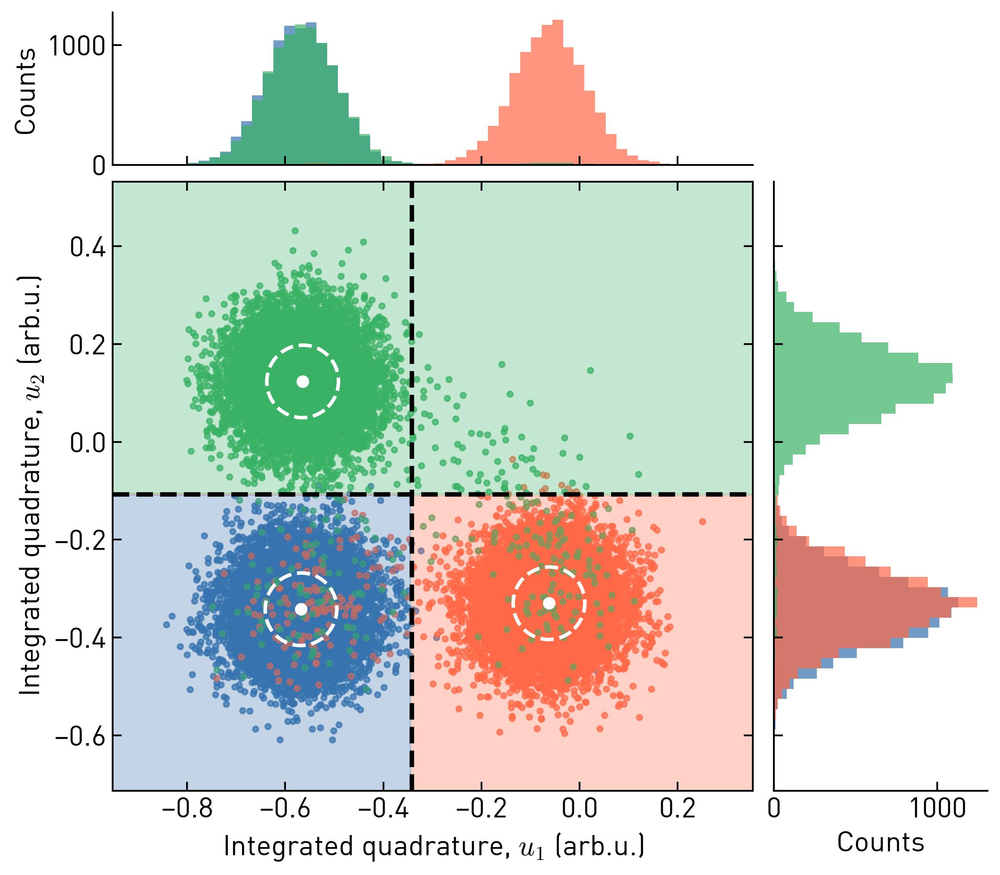

In [50]:

fig, ax = plt.subplots(figsize=(8,7))
kwargs = dict(fig=fig, scale="linear", show=False, frameon=True, colors=colors, 
              alpha=0.7)
fig = agmm.plot_scatter_and_marginal_hist(shots_to_plot,shot_labels, **kwargs)
axes = fig.get_axes()
# axes[0].set_aspect('equal')
# axes[1].spines["top"].set_visible(frameon.get("top", True))
# axes[1].spines["right"].set_visible(frameon.get("right", True))
axes[1].spines["top"].set_visible(False)
axes[1].spines["right"].set_visible(False)
axes[1].yaxis.set_tick_params(right=False)
axes[1].xaxis.set_tick_params(right=False, top=False)

axes[2].spines["top"].set_visible(False)
axes[2].spines["right"].set_visible(False)
axes[2].yaxis.set_tick_params(right=False, top=False)
axes[2].xaxis.set_tick_params(right=False, top=False)

axes[0].set_xlabel('Integrated quadrature, $u_1$ (arb.u.)')
axes[0].set_ylabel('Integrated quadrature, $u_2$ (arb.u.)')

plt.subplots_adjust(wspace=0.05, hspace=0.05*7/8)

# add kde
# from scipy import stats

# kde_x = stats.gaussian_kde(shots_to_plot[:, 0], )
# xx = np.linspace(-0.9, 0.2, 1000)
# axes[2].plot(xx, kde_x(xx)*500)



# add background
agmm.plot_clf_boundaries(shots_to_plot, agmm.clf_, ax=axes[0], cmap=cmap)
for m, cov in zip(means, covariances):
    agmm.plot_std(m, cov, n_std=1, ax=axes[0], edgecolor='w', linestyle='--', linewidth=2)
    axes[0].scatter([m[0]], [m[1]], color='w')
#     ssqtro.plot_std(m, cov, n_std=2, ax=axes[0], edgecolor='w', linestyle='--', linewidth=1.5)
#     ssqtro.plot_std(m, cov, n_std=3, ax=axes[0], edgecolor='w', linestyle='--', linewidth=1.5)

# add thresholds
if thresholded:
    axes[0].axvline(thresholds[0], linestyle='--', color='k')
    axes[0].axhline(thresholds[1], linestyle='--', color='k')
#     axes[0].text(-0.85, -0.65,"0b00", color=colors[0], weight='bold')
#     axes[0].text(0.05, -0.65,"0b01", color=colors[1], weight='bold')
#     axes[0].text(-0.85, 0.35,"0b10", color=colors[2], weight='bold')
#     axes[0].text(0.05, 0.35, "0b11",color=colors[2], weight='bold')

In [51]:
fig.savefig(figsave_base + "\\ch3_readout_GMM_scatter_and_hist_{}{:%Y%m%d_%H%M%S}.png".format("thresh_" if thresholded else "", 
                                                                                            datetime.datetime.now()),
            transparent=False)

## Readout matrix

In [52]:
fm = agmm.proc_data_dict['analysis_params']['state_prob_mtx_masked']
# standard error
(fm * (1-fm))/np.sqrt(50000)

array([[7.40597260e-06, 4.60904700e-06, 2.80271222e-06],
       [6.95139103e-05, 7.64388662e-05, 7.15119898e-06],
       [3.97715137e-05, 5.86802452e-05, 9.73844063e-05]])

[Text(0, 0, '$|g\\rangle$'),
 Text(1, 0, '$|e\\rangle$'),
 Text(2, 0, '$|f\\rangle$')]

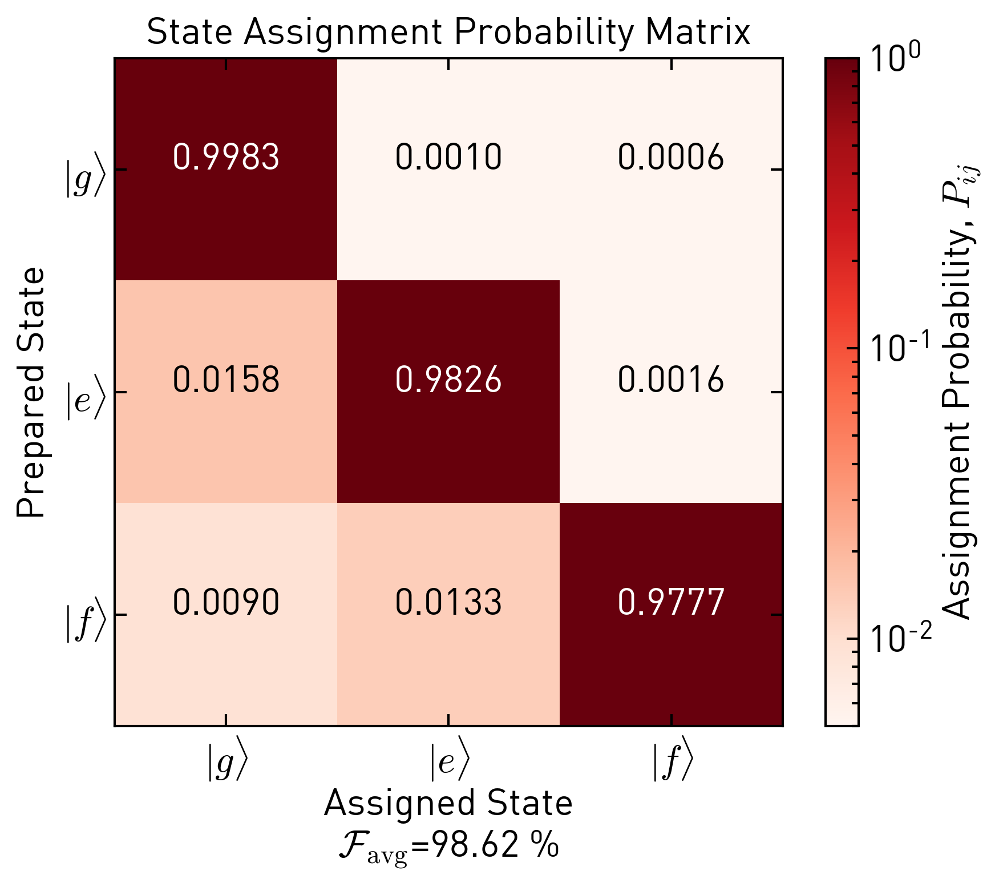

In [53]:
names = [r'$|g\rangle$',r'$|e\rangle$',r'$|f\rangle$']

fig, ax = plt.subplots(figsize=(6,5))
fig = agmm.plot_fidelity_matrix(fm, 
                          names, show=False, ax=ax, auto_shot_info=False)
ax.set_xticklabels(names, rotation=0)


In [54]:
fig.tight_layout()
fig.savefig(figsave_base + "ch3_readout_matrix_{}{:%Y%m%d_%H%M%S}.png".format(
    "thresh_" if thresholded else "",
    datetime.datetime.now()),
            transparent=False)

## Measurement induced transition

In [41]:
dist(mu_g, mu_e)/sigma

6.639191270125576

In [39]:
def dist(x1, x2):
    return np.sqrt((x1[0] - x2[0])**2 + (x1[1] - x2[1])**2)
def frac(distances, val):
    return len(distances[distances > val])/max(1,len(distances))

mu_g = agmm.proc_data_dict['analysis_params']['mu']['g']
mu_e = agmm.proc_data_dict['analysis_params']['mu']['e']
sigma = np.sqrt(np.mean(np.diag(agmm.clf_.covariances_)))

dists_g = []
dists_e = []

for pt, l in zip(agmm.proc_data_dict['data_masked']['X'], agmm.proc_data_dict["data_masked"]['prep_states']):
    if l == 0:
        dists_g.append(dist(pt, mu_g)/sigma)
    if l == 1:
        dists_e.append(min(dist(pt, mu_e)/sigma, dist(pt, mu_g)/sigma))
dists_g = np.array(dists_g)
dists_e = np.array(dists_e)
print(frac(dists_g, 5)*100)
print(frac(dists_e, 5)*100)
print(len(dists_g))

0.052575172385901765
0.018236343005349327
49453


## plot difference

In [246]:
def compare_fid_mtx(f, f_ref, ax=None, target_names=None, plot_kwargs=None, show_values_on_plot=True, ax_settings=None):
    """
    Plots the comparison of f and f_ref, i.e. f - f_ref.
    Note: both matrices should already be normalized.
    """
    if f.shape != f_ref.shape:
        raise ValueError(f"f and f_ref do not have the same shape: {f.shape} vs {f_ref.shape}")
    if plot_kwargs is None:
        plot_kwargs = {}
    if ax_settings is None:
        ax_settings = {}
    
    cmap = plot_kwargs.pop("cmap", plt.get_cmap("bwr"))
    if target_names is None:
        target_names = [l for _ , l in zip(range(len(f)), 'gef')] if  len(f) < 4 else [i for i in range(len(f))]
    if ax is None:
        fig, ax = plt.subplots(1, figsize=(8, 6))
    else:
        fig = ax.get_figure()
    fm = f - f_ref
    im = ax.imshow(fm, interpolation='nearest', cmap=cmap, **plot_kwargs)
    cb = fig.colorbar(im)
    cb.set_label("Assignment probability difference")
    tick_marks = np.arange(len(target_names))
    ax.set_xticks(tick_marks)
    ax.set_xticklabels( target_names, rotation=45)
    ax.set_yticks(tick_marks)
    ax.set_yticklabels(target_names)
    ax.set(**ax_settings)
    thresh = -0.05 #fm.max() / 2
    if show_values_on_plot: 
        for i, j in itertools.product(range(fm.shape[0]), range(fm.shape[1])):
            ax.text(j, i, "{:0.5f}".format(fm[i, j]),
                         horizontalalignment="center",
                         color="black" if fm[i, j] > thresh else "white")
    #return fig

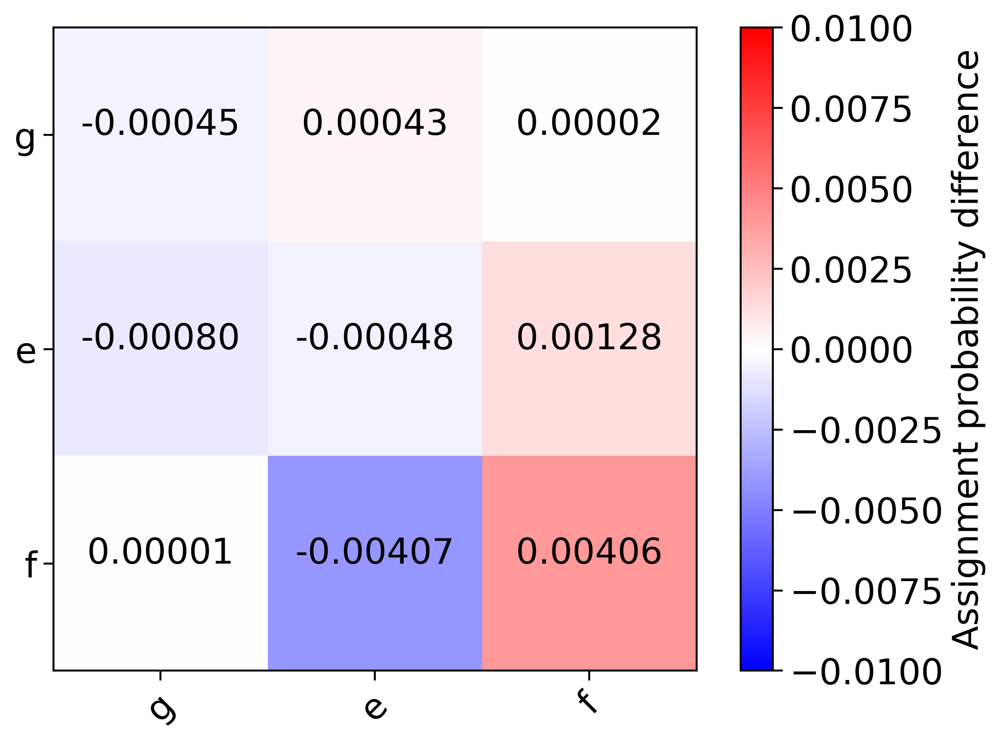

In [235]:
fm_gmm = agmm.proc_data_dict["analysis_params"]["state_prob_mtx_masked"]
fm_thr = athr.proc_data_dict["analysis_params"]["state_prob_mtx_masked"]
compare_fid_mtx(fm_thr, fm_gmm, plot_kwargs=dict(vmin=-0.01, vmax=0.01))

# Readout optimization

## amplitude sweep

['20191028_181312', '20191028_181329', '20191028_181347']
['20191028_181420', '20191028_181439', '20191028_181457']
['20191028_181529', '20191028_181547', '20191028_181605']
['20191028_181638', '20191028_181656', '20191028_181715']
['20191028_181747', '20191028_181805', '20191028_181823']
['20191028_181855', '20191028_181913', '20191028_181931']
['20191028_182003', '20191028_182021', '20191028_182038']
['20191028_182111', '20191028_182129', '20191028_182146']
['20191028_182219', '20191028_182236', '20191028_182254']
['20191028_182327', '20191028_182344', '20191028_182402']
['20191028_182435', '20191028_182454', '20191028_182512']
['20191028_182544', '20191028_182602', '20191028_182620']
['20191028_182653', '20191028_182711', '20191028_182729']
['20191028_182801', '20191028_182819', '20191028_182837']


KeyboardInterrupt: 

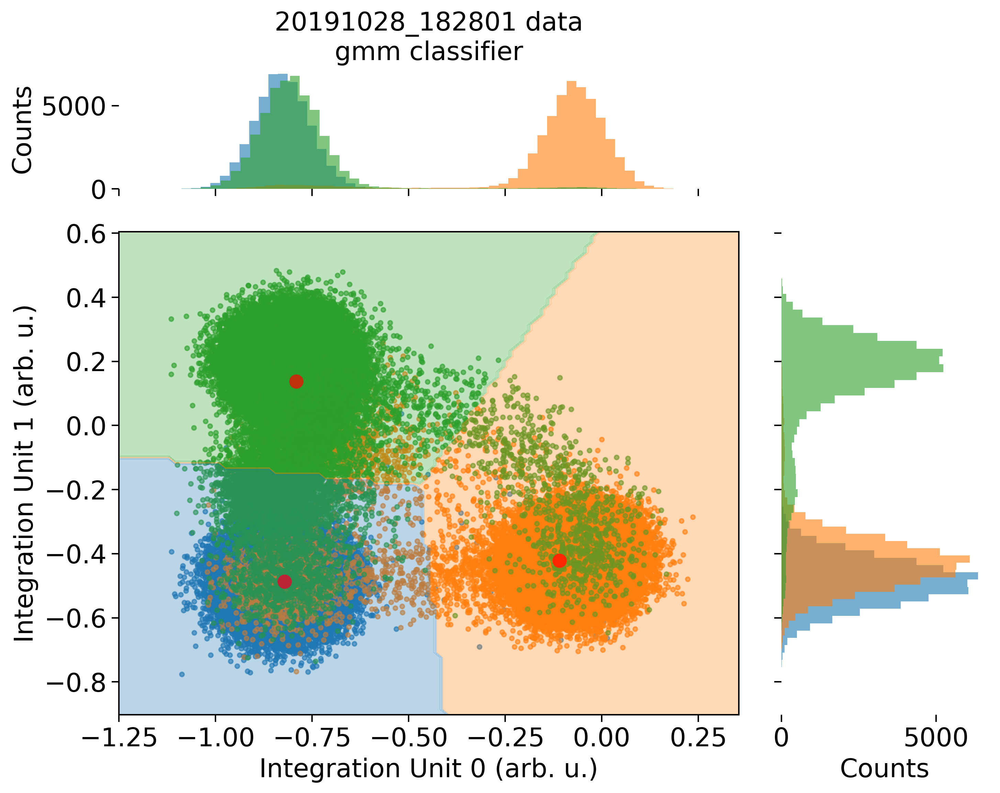

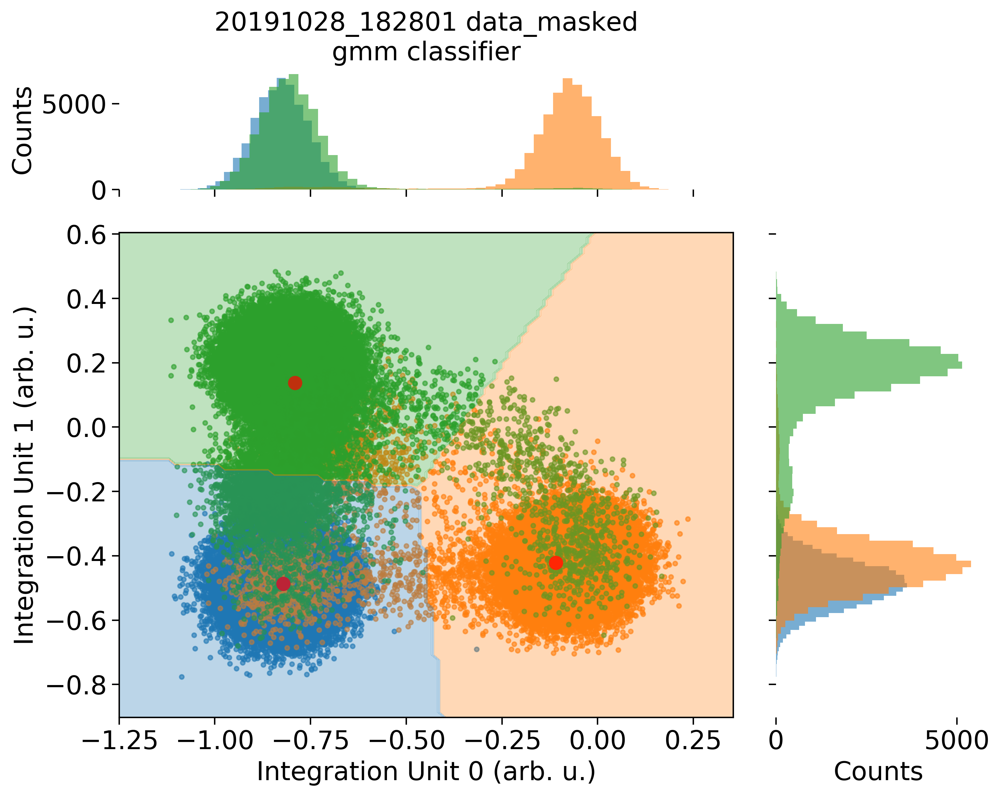

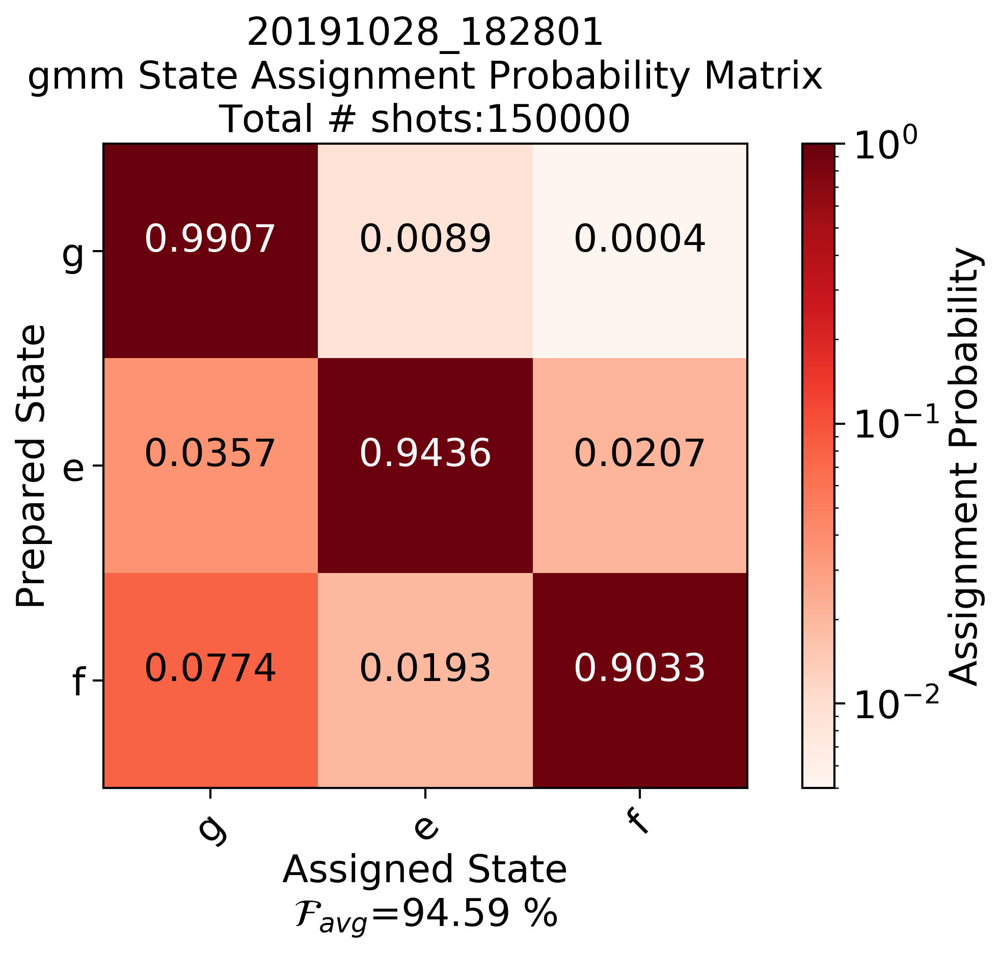

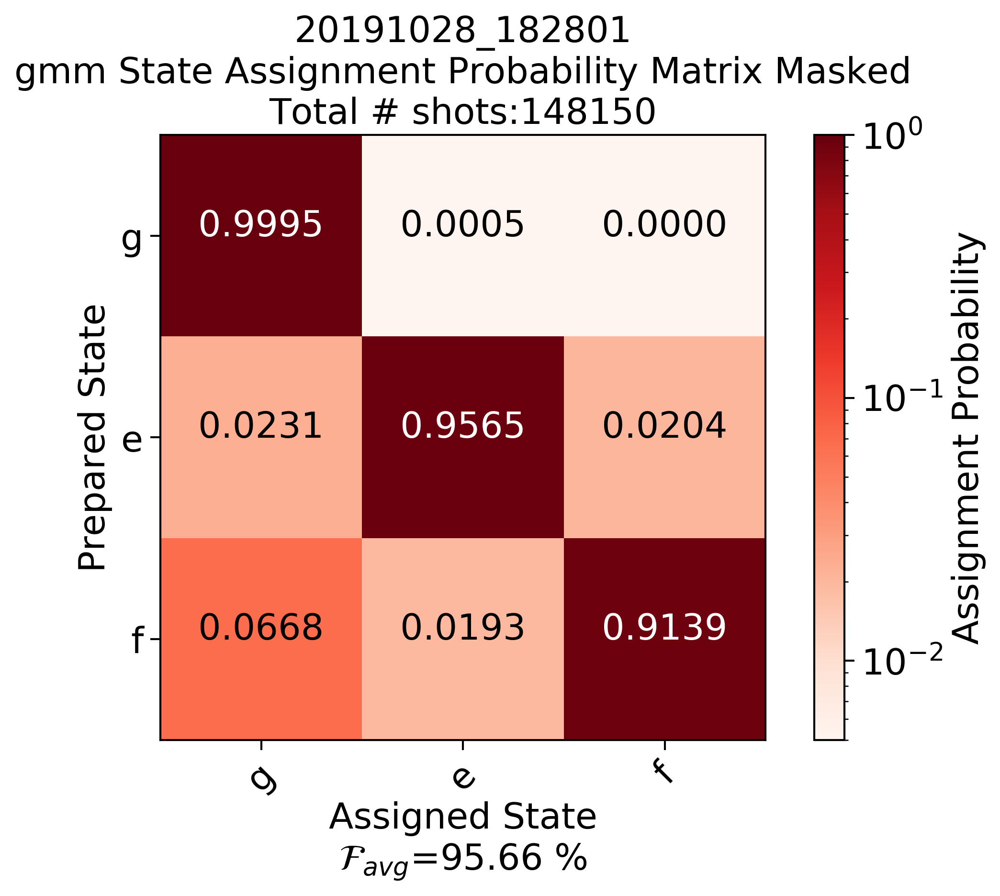

In [252]:

t_start = "20191028_181312"
t_end = "20191028_182945"
qbn = "qb1"
amplitudes = []
tps = a_tools.get_timestamps_in_range(t_start, t_end)
levels = ['g', 'e', 'f']
avg_f = []
h5mode =  'r+'
fms = []
for i in range(int(len(tps)/3)):
    options = dict(pre_selection=True, classif_method='gmm', show=False, classif_kw=dict(), 
               hist_scale="linear")
    a = ra.Singleshot_Readout_Analysis_Qutrit(t_start =tps[i*3:i*3+3], auto=Falselse,
                                               levels=levels,
                                               options_dict=options)
    a.extract_data()
    a.process_data()
    avg_f.append(np.mean(a.proc_data_dict['analysis_params']['state_prob_mtx_masked'][np.eye(3, dtype=bool)]))
    fms.append(a.proc_data_dict['analysis_params']['state_prob_mtx_masked'])
    folder = a_tools.get_folder(tps[i*3])
    h5filepath = a_tools.measurement_filename(folder)
    data_file = h5py.File(h5filepath, h5mode)
    amplitudes.append(eval(data_file['Instrument settings'][qbn].attrs["ro_amp"])*2)
    
amplitudes = np.array(amplitudes)
avg_f = np.array(avg_f)

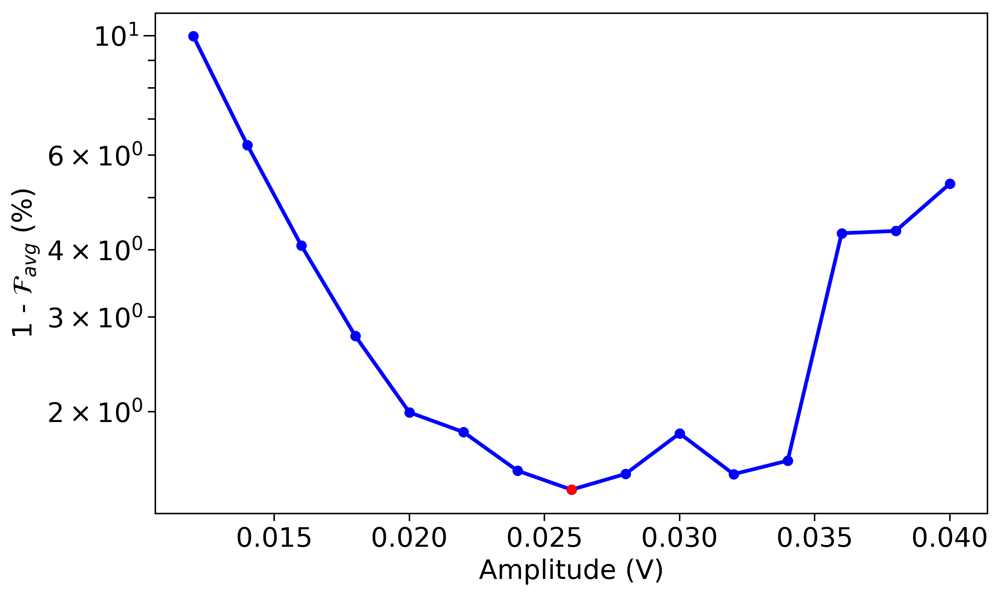

In [177]:

tol = 0.0001
fig, ax = plt.subplots()
chosen_amp = 0.026
ax.plot(amplitudes, 100 - avg_f*100, "b-o", zorder=-1)
ax.set_ylabel("1 - $\mathcal{F}_{avg}$ (%)")
ax.set_yscale("log")
ax.tick_params(axis='y', width=1, length=8)
ax.tick_params(axis='y', which="minor", width=1, length=5)
# ax.set_ylim([1, 12])
ax.set_xlabel("Amplitude (V)")
ax.scatter([chosen_amp], [100 - avg_f[np.argwhere(np.abs(np.array(amplitudes) - chosen_amp) < tol)][0][0]*100], color='r')

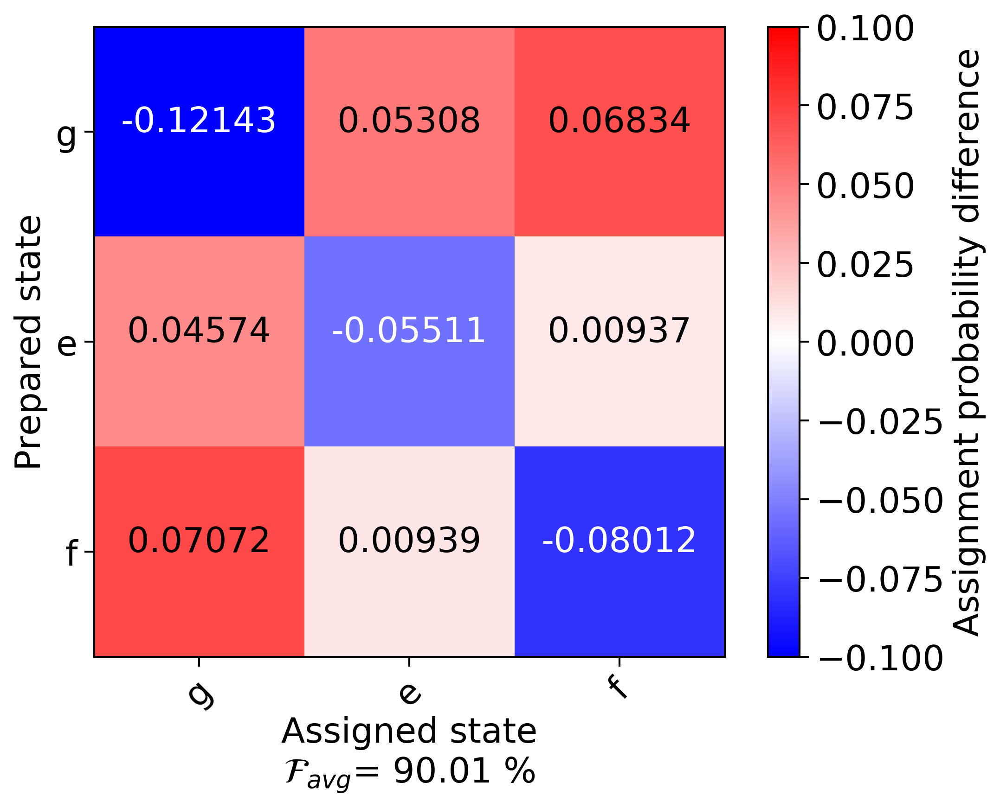

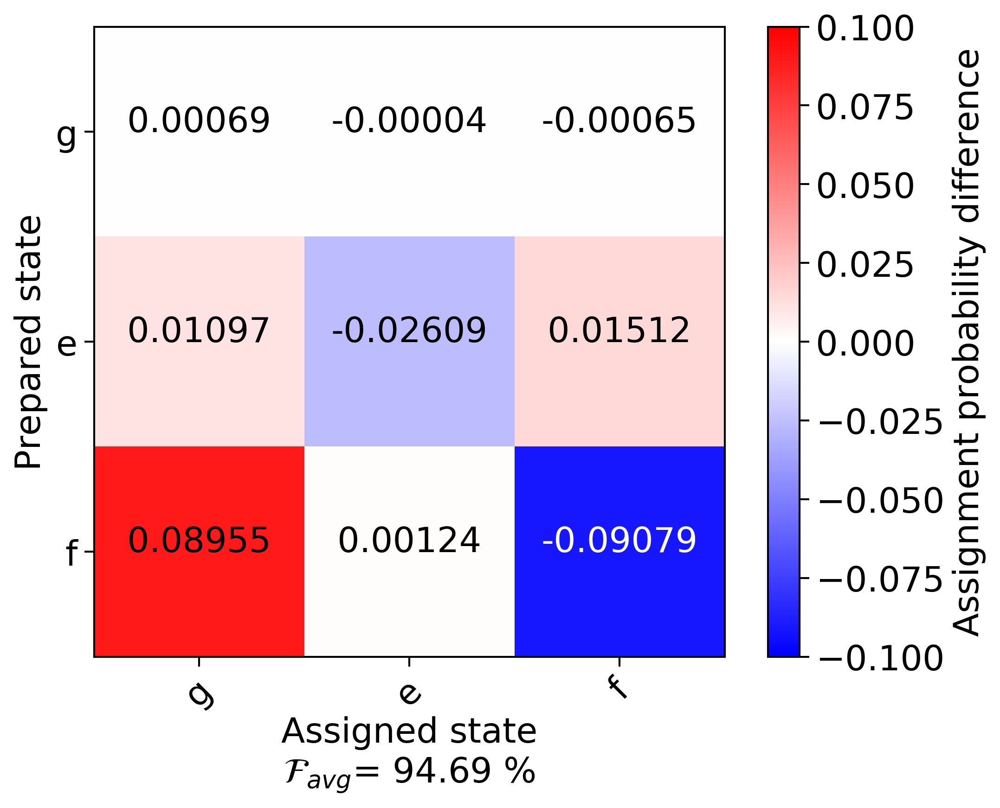

In [251]:
# compare fid matrices
plotkw = dict(vmin=-0.1, vmax=0.1)
ax_settings1 = dict(ylabel="Prepared state", 
                    xlabel="Assigned state\n$\mathcal{F}_{avg}$" + \
                    "= {:.2f} %".format(100*np.mean(fms[0][np.eye(3, dtype=bool)])))
compare_fid_mtx(fms[0], fms[7], plot_kwargs=plotkw, show_values_on_plot=True, ax_settings=ax_settings1)

ax_settings2 = dict(ylabel="Prepared state", xlabel="Assigned state\n$\mathcal{F}_{avg}$" + \
                    "= {:.2f} %".format(100*np.mean(fms[-1][np.eye(3, dtype=bool)])))

compare_fid_mtx(fms[-1], fms[7], plot_kwargs=plotkw, show_values_on_plot=True, ax_settings=ax_settings2)

## Integration length

In [186]:

t_start = "20191028_170126"
t_end = "20191028_171654"
qbn = "qb1"
int_length = []
tps = a_tools.get_timestamps_in_range(t_start, t_end)
levels = ['g', 'e', 'f']
avg_f = []
h5mode =  'r+'
for i in range(int(len(tps)/3)):
    options = dict(pre_selection=True, classif_method='gmm', show=False, classif_kw=dict(), 
               hist_scale="linear")
    a = ra.Singleshot_Readout_Analysis_Qutrit(#label=[labels[l] for l in levels], 
                                               t_start =tps[i*3:i*3+3], auto=False,
                                               levels=levels,
                                               options_dict=options)
    a.extract_data()
    a.process_data()
    avg_f.append(np.mean(a.proc_data_dict['analysis_params']['state_prob_mtx_masked'][np.eye(3, dtype=bool)]))
    folder = a_tools.get_folder(tps[i*3])

    h5filepath = a_tools.measurement_filename(folder)
    data_file = h5py.File(h5filepath, h5mode)
    int_length.append(eval(data_file['Instrument settings'][qbn].attrs["acq_length"])*1e9)
    
int_length = np.array(int_length)
avg_f = np.array(avg_f)

['20191028_170126', '20191028_170144', '20191028_170202']
['20191028_170232', '20191028_170251', '20191028_170309']
['20191028_170345', '20191028_170402', '20191028_170421']
['20191028_170458', '20191028_170515', '20191028_170534']
['20191028_170606', '20191028_170624', '20191028_170642']
['20191028_170714', '20191028_170732', '20191028_170750']
['20191028_170822', '20191028_170840', '20191028_170858']
['20191028_170930', '20191028_170948', '20191028_171006']
['20191028_171038', '20191028_171056', '20191028_171114']
['20191028_171146', '20191028_171204', '20191028_171221']
['20191028_171254', '20191028_171312', '20191028_171330']
['20191028_171403', '20191028_171420', '20191028_171438']
['20191028_171511', '20191028_171529', '20191028_171546']
['20191028_171618', '20191028_171636', '20191028_171654']


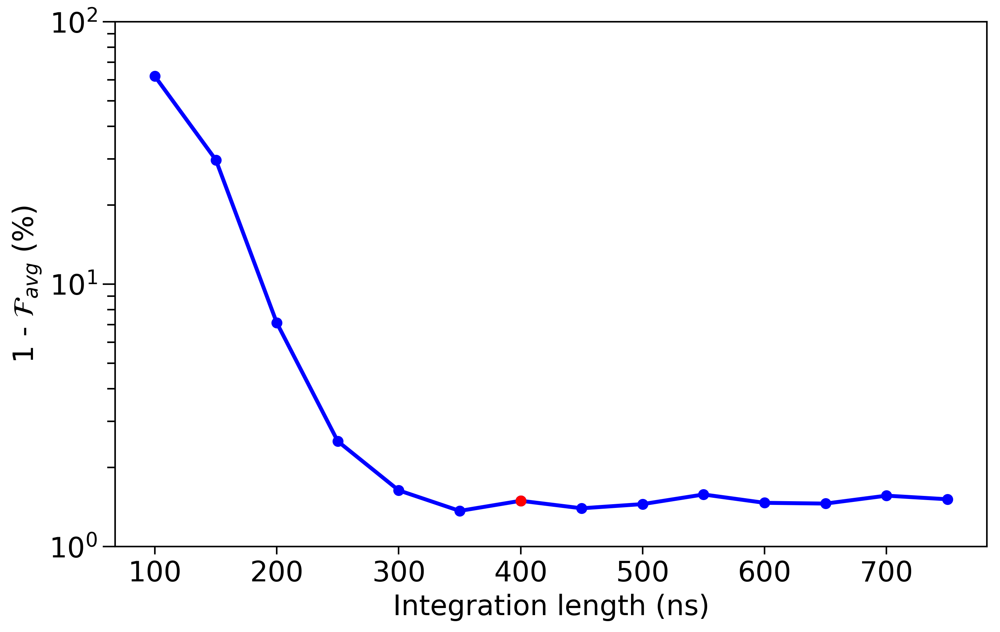

In [191]:
tol = 0.0001
fig, ax = plt.subplots()
chosen_int = 400
ax.plot(int_length, 100 - avg_f*100, "b-o", zorder=-1)
ax.set_ylabel("1 - $\mathcal{F}_{avg}$ (%)")
ax.set_yscale("log")
ax.tick_params(axis='y', width=1, length=8)
ax.tick_params(axis='y', which="minor", width=1, length=5)
ax.set_ylim([1, 100])
ax.set_xlabel("Integration length (ns)")
ax.scatter([chosen_int], [100 - avg_f[np.argwhere(np.abs(np.array(int_length) - chosen_int) < tol)][0]*100], color='r')

# Comparison to Threshold

In [4]:
from scipy.stats import multivariate_normal
def wrap_predict(x, y, clf, target_class):
    mean = clf.means_[target_class]
    if clf.covariance_type == 'tied':
        cov = clf.covariances_
    elif clf.covariance_type == 'full':
        cov = clf.covariances_[target_class] 
    else:
        raise NotImplementedError()
    return multivariate_normal.pdf([[x, y]], mean=mean, cov=cov)

def wrap_sample(n_samples, clf, target_class):
    mean = clf.means_[target_class]
    if clf.covariance_type == 'tied':
        cov = clf.covariances_
    elif clf.covariance_type == 'full':
        cov = clf.covariances_[target_class] 
    else:
        raise NotImplementedError()
    
    return np.asarray([multivariate_normal.rvs( mean=mean, cov=cov) for _ in range(n_samples)])

[Text(334.8, 362.4, 'X[1] <= -0.108\nentropy = 0.667\nsamples = 150000\nvalue = [50000, 50000, 50000]'),
 Text(167.4, 217.44, 'X[0] <= -0.342\nentropy = 0.517\nsamples = 101603\nvalue = [49954, 49908, 1741]'),
 Text(83.7, 72.47999999999996, 'entropy = 0.09\nsamples = 51867\nvalue = [49437, 1358, 1072]'),
 Text(251.10000000000002, 72.47999999999996, 'entropy = 0.047\nsamples = 49736\nvalue = [517, 48550, 669]'),
 Text(502.20000000000005, 217.44, 'X[0] <= -0.149\nentropy = 0.006\nsamples = 48397\nvalue = [46, 92, 48259]'),
 Text(418.5, 72.47999999999996, 'entropy = 0.003\nsamples = 48234\nvalue = [44, 37, 48153]'),
 Text(585.9, 72.47999999999996, 'entropy = 0.463\nsamples = 163\nvalue = [2, 55, 106]')]

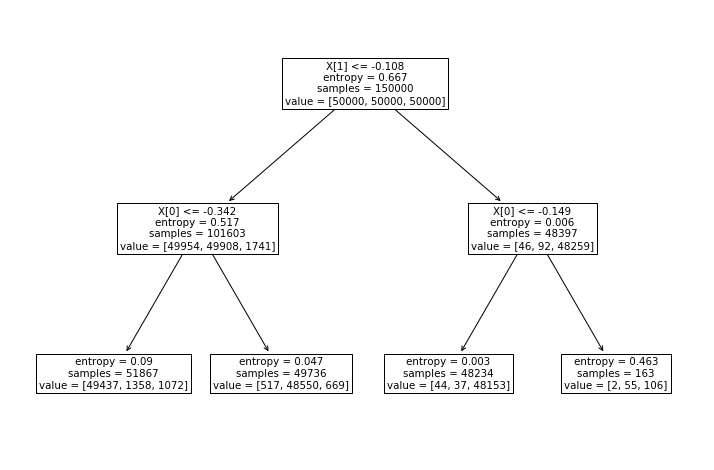

In [5]:
from sklearn.tree.export import export_text, plot_tree
fig, ax = plt.subplots(figsize=(12,8))
plot_tree(athr.clf_, ax=ax)

In [12]:
from collections import OrderedDict
import itertools
def _extract_tree_info(tree_clf, class_names=None):
    tree_ = tree_clf.tree_
    feature_name = [np.arange(tree_.n_features)[i]
                    for i in tree_.feature]
    print(feature_name)
    if class_names is None:
        class_names = np.arange(len(tree_.value[0]))
    thresholds, mapping = OrderedDict(), dict()

    def recurse(node, thresholds_final, loc, mapping, feature_depth_path):
        name = feature_name[node]
        feature_depth_path = feature_depth_path.copy() + [tree_.feature[node]]
        
        if tree_.feature[node] != -2:
            threshold = tree_.threshold[node]
            if not name in thresholds_final.keys():
                thresholds_final[name] = threshold
            recurse(tree_.children_left[node], thresholds_final,
                    loc + [0], mapping, feature_depth_path)
            recurse(tree_.children_right[node], thresholds_final,
                    loc + [1], mapping, feature_depth_path)
        else:
            print(loc, tree_.value[node], feature_depth_path)
            if len(loc) < tree_.n_features:
                print("Location < n_features, threshold mapping might not be correct")
                for l in itertools.combinations_with_replacement([0,1], tree_.n_features - len(loc)):
                    
                    loc_full =  loc + list(l)
                    #print(loc_full)
                    mapping[tuple([loc_full[i] for i in np.argsort(feature_depth_path[:-1])])] = class_names[np.argmax(tree_.value[node])]
                    #print(mapping)
            else:
                # swap if first threshold is on axis 1 FIXME: will work only when 2 integration units are used
                if list(thresholds_final.keys())[0] == 1:
                    loc = list(reversed(loc))
                mapping[tuple(loc)] = class_names[np.argmax(tree_.value[node])]
                print(mapping)
    recurse(0, thresholds, [], mapping,feature_depth_path=[])

    #translate keys to codeword index format
    mapping = {ra.Singleshot_Readout_Analysis_Qutrit._to_codeword_idx(k): v
               for k, v in mapping.items()}
    if len(mapping) < 2**tree_clf.max_depth:
        print(f"threshold mapping is of length {len(mapping)} instead of expected length {2**tree_clf.max_depth}. Mapping may be incorrect.")
    return thresholds, mapping

In [13]:
def threshold_infidelity(clf, target_class, clf_params, sigma=None, mean=None, class_mapping=dict(g=0, e=1, f=2)):
    mapping = clf_params['mapping']
    keys = [k for k in mapping if mapping[k] == target_class]
    if mean is None:
        mean = clf.means_[class_mapping[target_class]]
    if sigma is not None:
        cov = np.eye(2) * sigma **2
    elif clf.covariance_type == 'tied':
        cov = clf.covariances_
    elif clf.covariance_type == 'full':
        cov = clf.covariances_[target_class] 
    else:
        raise NotImplementedError()
    # p[i] is the prob of finding a datapoint in the quadrant i with:
    #  2 | 3
    # ------
    #  0 | 1
    # on that axis else 1
    p = dict()
    p[0] = multivariate_normal.cdf([clf_params['thresholds'][0], clf_params['thresholds'][1]], 
                                   mean=mean, cov=cov)
    p['(0, 0) (1, 0)'] = multivariate_normal.cdf([clf_params['thresholds'][0],  np.inf], 
                                                 mean=mean, cov=cov)
    p['(0, 0) (0, 1)'] = multivariate_normal.cdf([np.inf,  clf_params['thresholds'][1]], 
                                                 mean=mean, cov=cov)
    p[1] = p['(0, 0) (0, 1)'] - p[0]
    p[2] = p['(0, 0) (1, 0)'] - p[0]
    p[3] = 1 -  p[0] - p[1] -  p[2]
#     print(p)
#     print(keys)
    sum_quadrants = np.sum([p[k] for k in keys])
    return 1 - sum_quadrants
        
#max_fid_thr = [1-threshold_infidelity(agmm.clf_, i, athr.proc_data_dict["analysis_params"]["classifier_params"]) for i in 'gef']

# Rm part of data (draft)

In [10]:
X, y = agmm.proc_data_dict['data_masked'].values()


In [270]:
y_pred = agmm.clf_.predict(X)

In [273]:
decayed_from_f = (y_pred != 2) * (y == 2)
np.sum(decayed_from_f)

951

In [275]:
agmm.clf_.fit_predict(X[~decayed_from_f], y[~decayed_from_f])

array([0, 0, 0, ..., 2, 2, 2], dtype=int64)

array([[9.96610443e-01, 9.28092971e-04, 2.46146397e-03],
       [1.99983840e-02, 9.65538138e-01, 1.44634777e-02],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

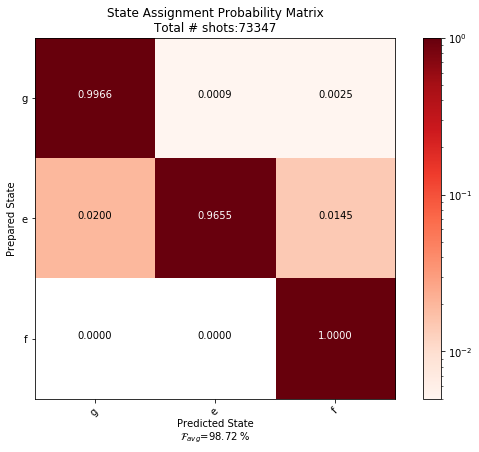

In [279]:
agmm.fidelity_matrix(y[~decayed_from_f], agmm.clf_.fit_predict(X[~decayed_from_f], y[~decayed_from_f]), plot=True )

# Comparison GMM Thr

In [248]:
athr.proc_data_dict["analysis_params"]["classifier_params"]

{'thresholds': {1: -0.035888671875, 0: 0.372802734375},
 'mapping': {0: 'e', 2: 'f', 1: 'g', 3: 'g'}}

In [99]:
states = 'gef'
means = agmm.proc_data_dict["analysis_params"]["classifier_params"]["means_"]
means_cpx = {s: [complex(*agmm.proc_data_dict["analysis_params"]["classifier_params"]['means_'][i])] for i, s in enumerate(states)}
means_cpx
sigma_exp = np.sqrt(np.mean(agmm.proc_data_dict["analysis_params"]["classifier_params"]['covariances_'][np.eye(2, dtype=bool)]))
sigma_exp

0.07361045706284762

In [103]:
import pycqed.analysis.fit_toolbox.geometry as geo
import scipy.integrate as integrate
from scipy.stats import multivariate_normal
def restricted_angle(angle):
        entire_div = angle // (np.sign(angle)*np.pi)
        return angle - np.sign(angle) * entire_div * 2 * np.pi
def f(gamma, val1=0, val2=1/(2*np.pi)):
    gamma = restricted_angle(gamma)
    return val1 if gamma > -np.pi/2 and gamma < np.pi/2 else val2
def evaluate_fidelity(spectra, sigma):
    def g(x, d, sigma=0.1):
        x = restricted_angle(x)
        return np.exp(-d ** 2 / np.cos(x) ** 2 / (2 * sigma ** 2))

    def integral(angle, dist, sigma):
        const = 1 / (2 * np.pi)
        p1 = const * integrate.quad(lambda x: f(x, g(x, dist, sigma=sigma), 0), angle - np.pi, angle)[0]
        return  -p1 + integrate.quad(lambda x: f(x), angle - np.pi, angle)[0] +  integrate.quad(lambda x: f(x, 1/(2*np.pi), 0), angle - np.pi, angle)[0]

    assert len(spectra) == 3, "3 spectra required for qutrit F_RO " \
                              "analysis. Found {}".format((len(spectra)))
    i1s, i2s, i3s = [], [], []
    # in most cases, states will be ['g', 'e', 'f'] but to ensure not to
    # be dependent on labels we take indices of keys
    states = list(spectra.keys())
    for i in range(len(spectra[states[0]])):
        pt1 = (spectra[states[0]][i].real, spectra[states[0]][i].imag)
        pt2 = (spectra[states[1]][i].real, spectra[states[1]][i].imag)
        pt3 = (spectra[states[2]][i].real, spectra[states[2]][i].imag)
        d1 = geo.distance(pt1, pt2) / 2
        d2 = geo.distance(pt2, pt3) / 2
        d3 = geo.distance(pt1, pt3) / 2
        # translate to point1
        pt2 = tuple(np.asarray(pt2) - np.asarray(pt1))
        pt3 = tuple(np.asarray(pt3) - np.asarray(pt1))
        pt1 = (0., 0.)
        c, R = geo.circumcenter(pt2, pt3, pt1, show=False)
        gamma1 = np.arccos(d1 / R)
        gamma2 = np.arccos(d2 / R)
        gamma3 = np.arccos(d3 / R)
        i1 = integral(gamma1, d1, sigma)
        i2 = integral(gamma2, d2, sigma)
        i3 = integral(gamma3, d3, sigma)
        i1s.append(i1)
        i2s.append(i2)
        i3s.append(i3)

    i1s, i2s, i3s = np.array(i1s), np.array(i2s), np.array(i3s)
    total_area = 2 * i1s + 2 * i2s + 2 * i3s
   # print(total_area)
    avg_fidelity = total_area / 3
    fid_state_0 = i1s + i3s
    not0 = 1 - fid_state_0
    fid_state_1 = i1s + i2s
    not1 = 1 - i1s + i2s
    fid_state_2 = i2s + i3s
    not2 = 1 - fid_state_2

    single_level_fid = {states[0]: fid_state_0,
                        states[1]: fid_state_1,
                        states[2]: fid_state_2}

    return avg_fidelity, single_level_fid

## STD sweep

In [11]:
BaseDataAnalysis.get_default_plot_params()

{'figure.figsize': (10, 6.180339887498948),
 'figure.dpi': 300,
 'savefig.dpi': 300,
 'font.size': 18,
 'figure.titlesize': 18,
 'legend.fontsize': 18,
 'axes.labelsize': 18,
 'axes.labelcolor': 'k',
 'axes.titlesize': 18,
 'axes.linewidth': 1,
 'lines.markersize': 6,
 'lines.linewidth': 2.5,
 'xtick.direction': 'out',
 'ytick.direction': 'out',
 'xtick.labelsize': 18,
 'ytick.labelsize': 18,
 'xtick.color': 'k',
 'ytick.color': 'k',
 'xtick.major.size': 5,
 'ytick.major.size': 5,
 'xtick.major.width': 1,
 'ytick.major.width': 1,
 'axes.formatter.useoffset': False}

In [7]:
from sklearn.tree import DecisionTreeClassifier as DTC

[0, 1, 0, 0, 1, 0, 0]
[0, 0] [[20369.  3062.  2843.]] [0, 1, -2]
{(0, 0): 'g'}
[0, 1] [[ 2761.   454. 20342.]] [0, 1, -2]
{(0, 0): 'g', (0, 1): 'f'}
[1, 0] [[ 1815. 20799.   574.]] [0, 1, -2]
{(0, 0): 'g', (0, 1): 'f', (1, 0): 'e'}
[1, 1] [[  55.  685. 1241.]] [0, 1, -2]
{(0, 0): 'g', (0, 1): 'f', (1, 0): 'e', (1, 1): 'f'}


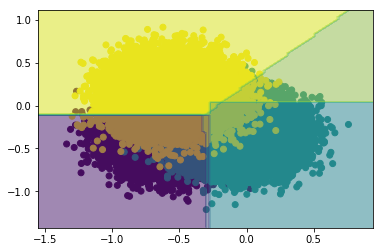

In [14]:
X_new, y_new = generate_synthetic_data(means, 0.04, 25000)
fig, ax = plt.subplots()
ax.scatter(X_new[:,0], X_new[:,1], c=y_new)
clf, _ = train_thr_clf(X_new, y_new, return_clf=True)
ra.Singleshot_Readout_Analysis_Qutrit.plot_clf_boundaries(X_new, agmm.clf_, ax=ax)
ra.Singleshot_Readout_Analysis_Qutrit.plot_clf_boundaries(X_new, clf, ax=ax)

In [ ]:
def generate_synthetic_data(means, cov, n=25000):
    if np.ndim(means) == 1:
        means = [means]
    X, y = [multivariate_normal.rvs(m, cov, n) for m in means], [[i for _ in range(n)] for  i, _ in enumerate(means)]
    return np.concatenate(X), np.concatenate(y)
def train_thr_clf(X, y, return_clf=False):
    clf = DTC(max_depth=2)
    clf.fit(X,y)
    clf_params = {}
    clf_params['thresholds'], clf_params['mapping'] = _extract_tree_info(clf, 'gef')
    return (clf, clf_params) if return_clf else clf_params
def new_thresholds(means, cov):
    return train_thr_clf(*generate_synthetic_data(means, cov))

def snr(mu1, mu2, sigma):
    return np.linalg.norm(mu1-mu2)/sigma
def all_snr(means, sigma):
    """
    Computes SNR for all combinations of means given a sigma
    Args:
        means (array or list): (n_means, n_dim) where n_dim is usually 2.
    Returns:
        average, min and max SNRs
    """
    all_snr = [snr(means[i], means[j], sigma) 
               for (i, j) in itertools.combinations(np.arange(len(means)), 2)]
    return np.min(all_snr), np.max(all_snr), np.mean(all_snr)
threshold_params = new_thresholds(means, np.eye(2)*sigma_exp**2) ; threshold_params

Here we compare GMM classifier from data with the best of 2 threshold classifiers,
one trained on synthetic data using parameters (means, cov) from the experiment and one which is trained at place where difference between both is the largest (for this dataset it is for sigma = 0.2)

In [63]:
from pycqed.analysis_v2.base_analysis import BaseDataAnalysis
BaseDataAnalysis.get_default_plot_params()

{'figure.figsize': (10, 6.180339887498948),
 'figure.dpi': 300,
 'savefig.dpi': 300,
 'font.size': 18,
 'figure.titlesize': 18,
 'legend.fontsize': 18,
 'axes.labelsize': 18,
 'axes.labelcolor': 'k',
 'axes.titlesize': 18,
 'axes.linewidth': 1,
 'lines.markersize': 6,
 'lines.linewidth': 2.5,
 'xtick.direction': 'out',
 'ytick.direction': 'out',
 'xtick.labelsize': 18,
 'ytick.labelsize': 18,
 'xtick.color': 'k',
 'ytick.color': 'k',
 'xtick.major.size': 5,
 'ytick.major.size': 5,
 'xtick.major.width': 1,
 'ytick.major.width': 1,
 'axes.formatter.useoffset': False}

[0, 1, 0, 0, 1, 0, 0]
[0, 0] [[2.4974e+04 9.0000e+00 1.6000e+01]] [0, 1, -2]
{(0, 0): 'g'}
[0, 1] [[2.300e+01 0.000e+00 2.498e+04]] [0, 1, -2]
{(0, 0): 'g', (0, 1): 'f'}
[1, 0] [[3.0000e+00 2.4991e+04 0.0000e+00]] [0, 1, -2]
{(0, 0): 'g', (0, 1): 'f', (1, 0): 'e'}
[1, 1] [[0. 0. 4.]] [0, 1, -2]
{(0, 0): 'g', (0, 1): 'f', (1, 0): 'e', (1, 1): 'f'}
[0, 1, 0, 0, 1, 0, 0]
[0, 0] [[20659.  3247.  2991.]] [0, 1, -2]
{(0, 0): 'g'}
[0, 1] [[ 2679.   513. 20348.]] [0, 1, -2]
{(0, 0): 'g', (0, 1): 'f'}
[1, 0] [[ 1633. 20787.   673.]] [0, 1, -2]
{(0, 0): 'g', (0, 1): 'f', (1, 0): 'e'}
[1, 1] [[ 29. 453. 988.]] [0, 1, -2]
{(0, 0): 'g', (0, 1): 'f', (1, 0): 'e', (1, 1): 'f'}


<IPython.core.display.Javascript object>


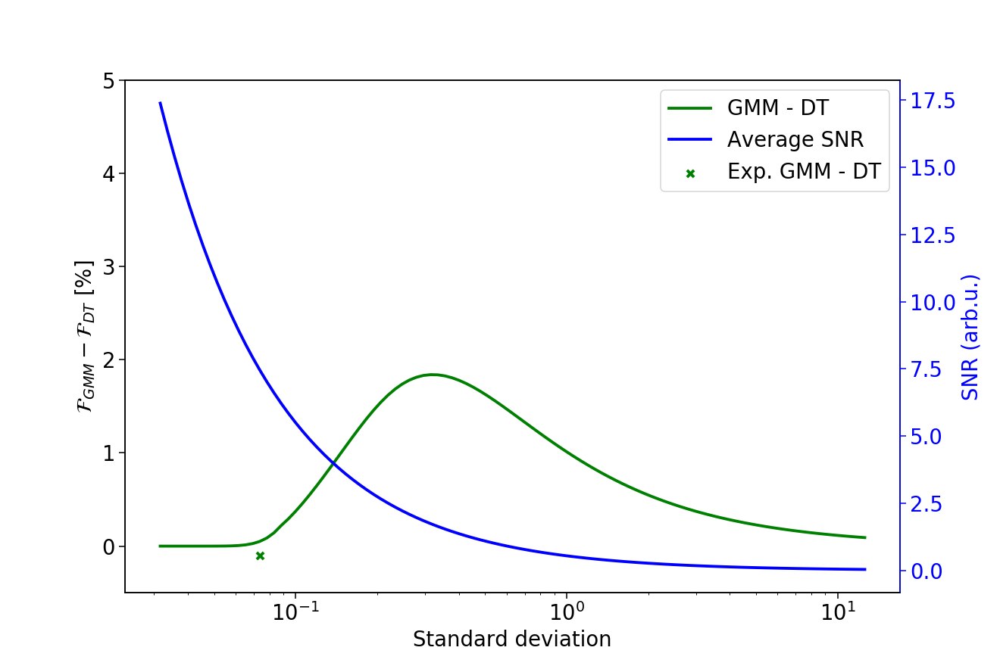

In [104]:
gmm_classif_max_fid_std, thr_classif_max_fid_std, thr_classif_max_fid_std2 = [] , [], []
                     
# from file
#threshold_params = athr.proc_data_dict["analysis_params"]["classifier_params"]
# one mapping
# threshold_params = new_thresholds(means, np.eye(2)*sigma_exp**2)
# threshold_params2 = threshold_params
# two mappings
threshold_params = new_thresholds(means, np.eye(2)*sigma_exp**2)
sigma_worst = 0.2
threshold_params2 = new_thresholds(means, np.eye(2)*sigma_worst**2)
threshold_params2['mapping'] ={0: 'g', 2: 'f', 1: 'e', 3: 'e'}
threshold_params2
# threshold_params2 = deepcopy(threshold_params)
# threshold_params2['mapping'] = {0: 'g', 2: 'f', 1: 'e', 3: 'e'}

retrain = False

sigmas = np.logspace(-1.5,1.1,100)
for sigma in sigmas:
    
    gmm_classif_max_fid_std.append(evaluate_fidelity(means_cpx, sigma)[0][0])
    thr_classif_max_fid_std.append(np.mean([1-threshold_infidelity(agmm.clf_, i, threshold_params, sigma) 
                                        for i in 'gef']))
    thr_classif_max_fid_std2.append(np.mean([1-threshold_infidelity(agmm.clf_, i, threshold_params2, sigma) 
                                        for i in 'gef']))
gmm_classif_max_fid_std = np.array(gmm_classif_max_fid_std)
thr_classif_max_fid_std = np.array(thr_classif_max_fid_std)
thr_classif_max_fid_std2 = np.array(thr_classif_max_fid_std2)


#plotting
fig, axes = plt.subplots(1, figsize=(12,8), sharex=True)
ax2 = axes
best_thr_fid = np.maximum(thr_classif_max_fid_std, thr_classif_max_fid_std2)
l1 = ax2.plot(sigmas, (gmm_classif_max_fid_std-best_thr_fid)*100, color='g', label='GMM - DT')
ax2.set_ylabel('$\mathcal{F}_{GMM} -\mathcal{F}_{DT}$ [%]')
ax2.set_xlabel('Standard deviation')
ax2.set_xscale('log')
ax2.set_ylim([-0.5,5])
sc = ax2.scatter([sigma_exp], [100*np.mean(agmm.proc_data_dict['analysis_params']['state_prob_mtx_masked'][np.eye(3, dtype=bool)]) - 100*np.mean(athr.proc_data_dict['analysis_params']['state_prob_mtx_masked'][np.eye(3, dtype=bool)])], 
            color='g', marker='x', label="Exp. GMM - DT")
ax2twin = ax2.twinx()
snrs = np.array([all_snr(means, sigma) for sigma in sigmas])
l2 = ax2twin.plot(sigmas, snrs[:, -1], color='b', label="Average SNR")
ax2twin.set_ylabel("SNR (arb.u.)")
# added these three lines
lns = l1 + l2 + [sc]
labs = [l.get_label() for l in lns]
ax2twin.legend(lns, labs)
ax2twin.spines['right'].set_color('b')
ax2twin.yaxis.label.set_color('b')
ax2twin.tick_params(axis='y', colors='b')
# ax2twin.set_yscale("log")
# ax2.legend()

# ax2.set_yscale("symlog", linthreshy=1e-6)
#ax.set_ylim([1e-1, 1e0])

In [56]:
tol = 0.001
np.argwhere(np.abs(sigmas - sigma_exp) < tol)

array([[14]], dtype=int64)

In [93]:
tol = 0.0005
np.argwhere(np.abs(diff - 0.01) < tol)

array([[63],
       [64]], dtype=int64)

In [95]:
sigmas[63]

1.427399218172586

In [94]:
all_snr(means, 0.25)

(0.3264281813163441, 0.47417566541794937, 0.3849828206569263)

In [57]:
diff = gmm_classif_max_fid_std - thr_classif_max_fid_std
print(np.amax(diff))
sigmas[np.argmax(diff)]

0.031360383858436536


0.27890387320175947

## mean expansion

In [102]:
np.angle()

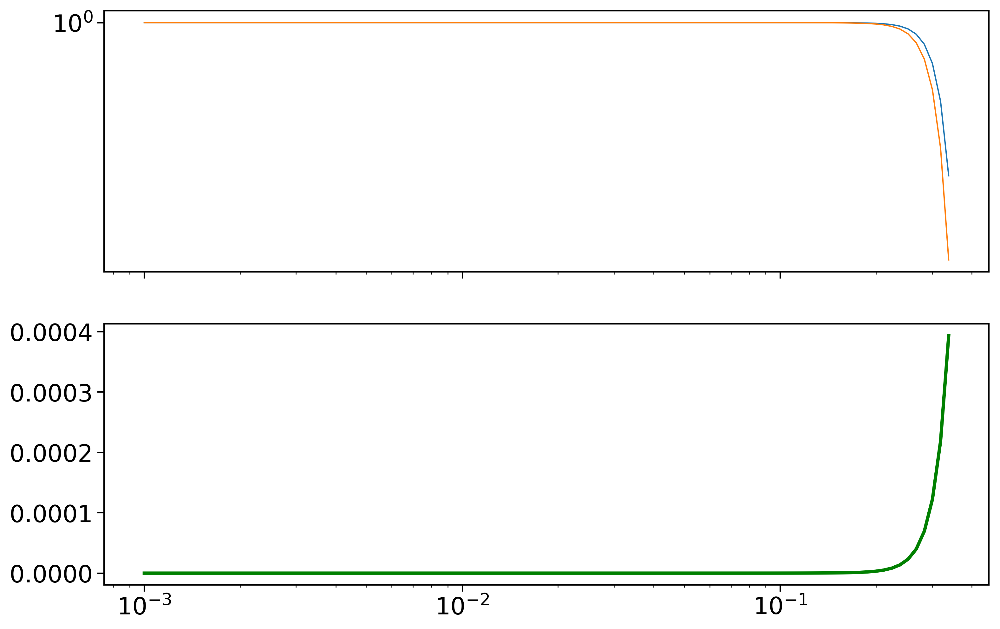

In [21]:
def scale_pt(pt, line, s, sign=1):
    angle = np.angle(1 + 1j*line[0])
    return (pt[0] + s*np.cos(angle)*sign, pt[1] + s*np.sin(angle)*sign)
def rescale(means_arr, lines, scale, sign=None):
    if sign is None:
        sign = np.ones(len(lines))
    return np.asarray([scale_pt(m, line, scale, s) for m, line, s in zip(means_arr, lines, sign)])

gmm_classif_max_fid_mean, thr_classif_max_fid_mean = [] , []
states = 'gef'
#threshold_params = athr.proc_data_dict["analysis_params"]["classifier_params"]
means = agmm.proc_data_dict["analysis_params"]["classifier_params"]["means_"]
sign = [1, -1, 1]
cc, circum_radius = geo.circumcenter(*means)
scale_factor = np.logspace(-3, np.log10(circum_radius),100) - circum_radius
lines = []
for m in means:
    lines.append(geo.getLine(m, cc))

for scale in scale_factor:
    translated_means = rescale(means, lines, scale, sign=sign)
    translated_means_complex = {s: [complex(*translated_means[i])] for i, s in enumerate(states)}
    gmm_classif_max_fid_mean.append(evaluate_fidelity(translated_means_complex, sigma_exp)[0][0])
    thr_classif_max_fid_mean.append(np.mean([1-threshold_infidelity(agmm.clf_, i, threshold_params, sigma_exp, mean=translated_means[j]) 
                                   for j, i in enumerate(states)]))
gmm_classif_max_fid_mean = np.array(gmm_classif_max_fid_mean)
thr_classif_max_fid_mean = np.array(thr_classif_max_fid_mean)
diff = gmm_classif_max_fid_mean-thr_classif_max_fid_mean

fig, axes = plt.subplots(2, figsize=(12,8), sharex=True)
ax, ax2 = axes
ax.plot(circum_radius + scale_factor, gmm_classif_max_fid_mean, linewidth=1)
ax.plot(circum_radius + scale_factor, thr_classif_max_fid_mean, linewidth=1)
ax2.plot(circum_radius + scale_factor, diff, color='g')
#ax.plot(sigmas, sc.erfc(1/sigmas))
ax.set_xscale('log')
ax.set_yscale('log')
#ax2.set_yscale('log')
#ax2.set_ylim([1e-3, 1e0])

In [27]:
from matplotlib import colors
gmm_classif_max_fid_mean, thr_classif_max_fid_mean = [] , []
states = 'gef'
#threshold_params = athr.proc_data_dict["analysis_params"]["classifier_params"]
means = agmm.proc_data_dict["analysis_params"]["classifier_params"]["means_"]
sign = [1, 1, 1]
cc, circum_radius = geo.circumcenter(*means)
scale_factor = np.logspace(-3, 12, 40) - circum_radius
sigmas = np.logspace(-2, 12, 40)
lines = []
diffs = []
fids_gmm = []
for m in means:
    lines.append(geo.getLine(m, cc))
for sigma in sigmas:
    gmm_classif_max_fid_mean, thr_classif_max_fid_mean = [] , []
    for scale in scale_factor:
        translated_means = rescale(means, lines, scale, sign=sign)
        translated_means_complex = {s: [complex(*translated_means[i])] for i, s in enumerate(states)}
        gmm_classif_max_fid_mean.append(evaluate_fidelity(translated_means_complex, sigma)[0][0])
        thr_classif_max_fid_mean.append(np.mean([1-threshold_infidelity(agmm.clf_, i, threshold_params, sigma, mean=translated_means[j]) 
                                       for j, i in enumerate(states)]))
    gmm_classif_max_fid_mean = np.array(gmm_classif_max_fid_mean)
    thr_classif_max_fid_mean = np.array(thr_classif_max_fid_mean)
    diff = gmm_classif_max_fid_mean-thr_classif_max_fid_mean
    diffs.append(diff)
    fids_gmm.append(gmm_classif_max_fid_mean)
diffs = np.asarray(diffs)
fids_gmm = np.asarray(fids_gmm)

c:\users\nathan\masterthesis\code\env\lib\site-packages\ipykernel_launcher.py:16: IntegrationWarning: The algorithm does not converge.  Roundoff error is detected
  in the extrapolation table.  It is assumed that the requested tolerance
  cannot be achieved, and that the returned result (if full_output = 1) is 
  the best which can be obtained.
  app.launch_new_instance()


In [233]:
np.save('diff_fid_gmm_thr_200_pt_xx.npy', diffs)
diff2 = diffs

In [238]:
x_mask = circum_radius + scale_factor < 0.9
y_mask = sigmas < sigma_exp - 0.02
mask = np.zeros_like(diffs, dtype=bool)
mask2 = np.copy(mask)
mask[:, x_mask] = True
mask2[y_mask] = True
final_mask = mask * mask2

Text(0.5, 1.0, '$\\mathcal{F}_{GMM} - \\mathcal{F}_{DT}$ [%]\n')

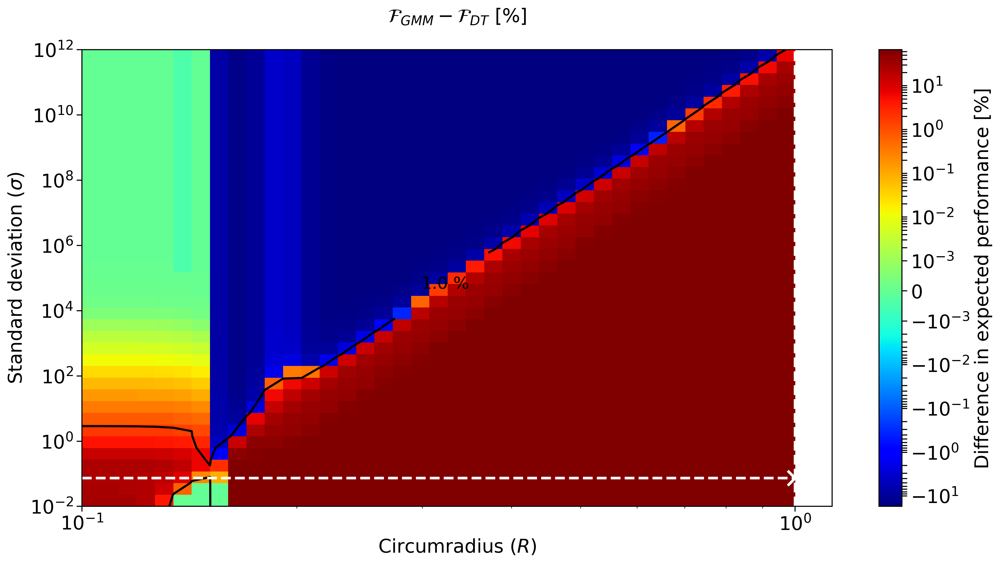

In [28]:
diffs_masked = diffs #np.ma.masked_where(final_mask, diffs)
fig, ax = plt.subplots(figsize=(16,8))
cs = ax.pcolormesh((circum_radius + scale_factor)/sigmas, sigmas, diffs_masked*100, norm=colors.SymLogNorm(linthresh=0.001), cmap=plt.get_cmap('jet'))
contour = ax.contour((circum_radius + scale_factor)/sigmas, sigmas, diffs_masked*100, levels=[1], colors=['k', 'k'], linewidths=2)
ax.clabel(contour, inline=1, inline_spacing=100, fontsize=16,  fmt={1: "1.0 %"})
ax.set_yscale('log')
ax.set_xscale('log')
ax.scatter(1, sigma_exp, marker='x', color='w', s=200)
ax.axvline(1, linestyle='--', color='w')
ax.axhline(sigma_exp, linestyle='--', color='w')
#ax.set_xlim(1e-1,1e1)
cbar = fig.colorbar(cs)
ax.set_xlabel('Circumradius ($R$)')
ax.set_ylabel('Standard deviation ($\sigma$)')
cbar.ax.set_ylabel('Difference in expected performance [%]')
ax.set_title('$\mathcal{F}_{GMM} - \mathcal{F}_{DT}$ [%]\n')

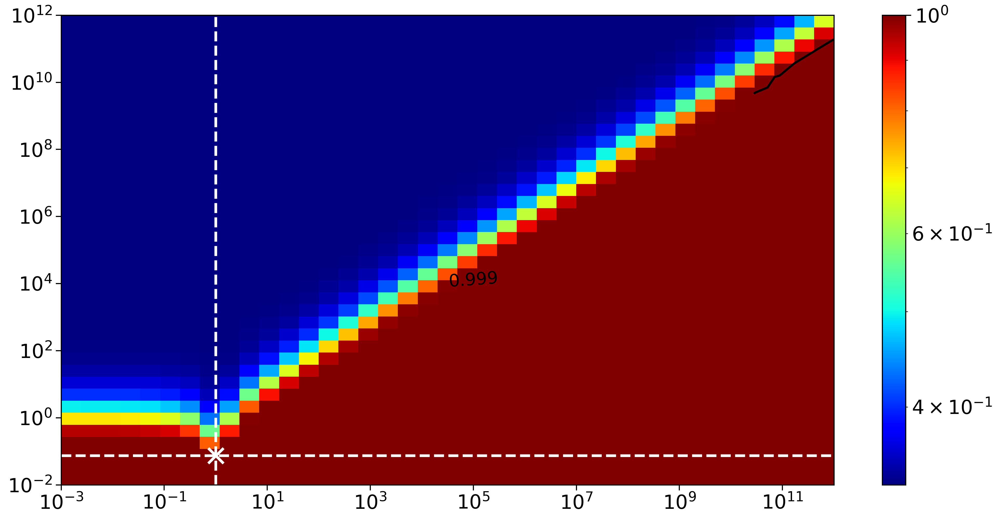

In [26]:
fids_gmm = np.asarray(fids_gmm)
fids_gmm_masked = fids_gmm #np.ma.masked_where(final_mask, fids_gmm)
fig, ax = plt.subplots(figsize=(16,8))
cs = ax.pcolormesh(circum_radius + scale_factor, sigmas, fids_gmm_masked, norm=colors.LogNorm(), cmap=plt.get_cmap('jet'))
contour = ax.contour(circum_radius + scale_factor, sigmas, fids_gmm_masked, levels=[0.999], colors=['k'], linewidths=2)
ax.clabel(contour, inline=1, inline_spacing=5, fontsize=16)
ax.set_yscale('log')
ax.set_xscale('log')
ax.scatter(1, sigma_exp, marker='x', color='w', s=200)
ax.axvline(1, linestyle='--', color='w')
ax.axhline(sigma_exp, linestyle='--', color='w')
#ax.set_xlim(1e-1,1e1)
fig.colorbar(cs)

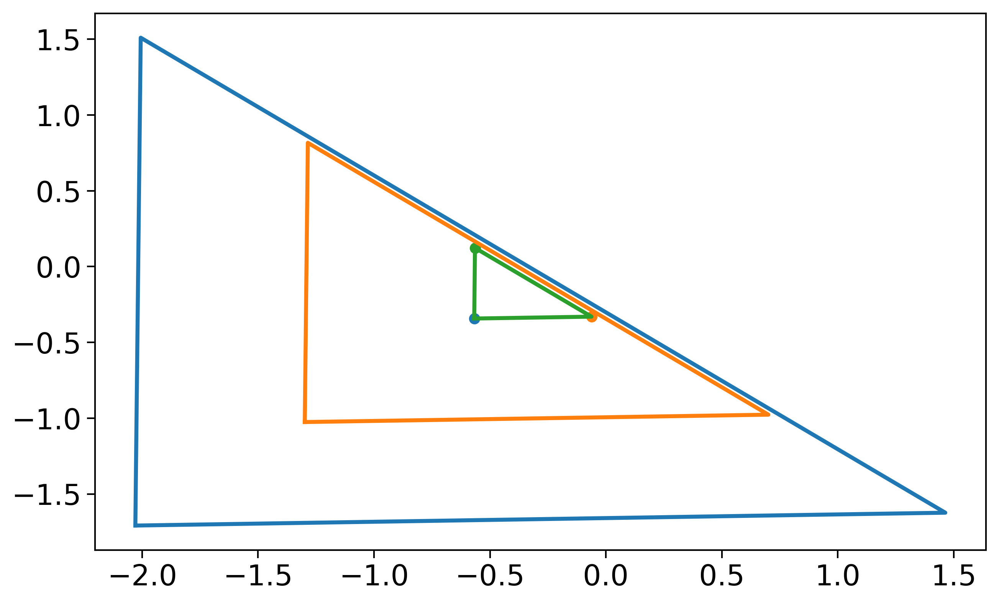

In [53]:
for m in means:
    plt.scatter(m[0],m[1])
sign=[1, -1, 1]
#plt.scatter(*(0.37042557394523656, -0.12421305479594395), color='r')
# for x in np.arange(0,0.5,0.1):
#     plt.scatter(*scale_pt(means[1], lines[1], x, sign=-1))
# for x in np.arange(0,0.5,0.1):
#     plt.scatter(*scale_pt(means[2], lines[2],x))
# for x in np.arange(0,0.5,0.1):
#     plt.scatter(*scale_pt(means[0], lines[0],x))
for scaling in [-2, -1, 0]:
    arr = [scale_pt(means[i], lines[i], scaling, sign[i]) for i in range(3)] + [scale_pt(means[0], lines[0], scaling, sign[0])]
    arr = np.asarray(arr)
    plt.plot(arr[:, 0], arr[:, 1])

In [47]:
 np.arange(-0.3,0.7, 0.1)

array([-3.00000000e-01, -2.00000000e-01, -1.00000000e-01,  5.55111512e-17,
        1.00000000e-01,  2.00000000e-01,  3.00000000e-01,  4.00000000e-01,
        5.00000000e-01,  6.00000000e-01])

## responsibility of theoretical overlap

In [223]:
sigmas[14]

0.07373552345259002

In [225]:

err_overlap = (1 - gmm_classif_max_fid_std[14])
err_overlap

0.0007286570355035105

# T1 decay


In [283]:
%matplotlib qt

In [2]:
(12.92 + 13.83 +16.02 +14.96)/4

14.4325

In [5]:
t1_ge = 25.11
t1_ef = 14.43
int_length = 0.28 #0.400
t = np.linspace(0, 10, 1000)
1- np.exp(-1/t1_ge*int_length)

0.011088994644635752

responsibility of T1 decay

In [9]:
1.11/3 + 1.93/3

1.0133333333333334

In [8]:
t1_ef = 14.4
err_t1_ef = 1 - np.exp(-1/t1_ef*int_length)
err_t1_ef

0.019256620581497574

In [45]:
import pandas as pd
from pycqed.analysis_v2 import spectroscopy_analysis as sa
# thermal population estimates
preselection = True
df = pd.DataFrame()
if preselection:
    state_prob_mtx = agmm.proc_data_dict['analysis_params']['state_prob_mtx']
    state_prob_mtx_masked = agmm.proc_data_dict['analysis_params']['state_prob_mtx_masked']
    therm_pop_err = state_prob_mtx - state_prob_mtx_masked
    diag_mask = ~np.diag(np.ones(len(state_prob_mtx), dtype=bool))
    therm_pop_err = np.sum(therm_pop_err * diag_mask, axis=1)
    df['Thermal population'] = np.concatenate([therm_pop_err, [np.mean(therm_pop_err)]])

# decay errors
decay_err = np.zeros(len(states))
for i, state in enumerate(states):
    if state == 'g':
        decay_err[i] = 0
    elif state == 'e':
        decay_err[i] = 1 - np.exp(-1 / t1_ge * (int_length))
    elif state == 'f':
        decay_err[i] = 1 - np.exp(-1 / t1_ef * (int_length))
df['Decay'] = np.concatenate([decay_err, [np.mean(decay_err)]])

# Readout overlap
if len(states) == 3:
    sigma = np.sqrt(np.mean(agmm.proc_data_dict["analysis_params"]["classifier_params"]['covariances_'][np.eye(2, dtype=bool)]))
    means_cpx = {s: [complex(*agmm.proc_data_dict["analysis_params"]["classifier_params"]['means_'][i])]
                for i, s in enumerate(states)}
    err_tot_overlap = (1 - sa.ResonatorSpectroscopy_v2.three_gaussians_overlap(means_cpx, sigma_exp)[0][0])
    df['Readout Overlap'] = [np.nan]*len(states) +  [err_tot_overlap]
df.index = [s for s in states] + ["Average"]

# Other
avg_fid = np.average(state_prob_mtx[np.eye(len(states), dtype=bool)])
other = 1 - np.concatenate([state_prob_mtx[np.eye(len(states), dtype=bool)], [avg_fid]]) - df.transpose().sum()
df['Other']  = other

In [46]:
df

,Thermal population,Decay,Readout Overlap,Other
g,0.009627,0.000000,NaN,0.001213
e,0.011601,0.015804,NaN,0.001116
f,0.012488,0.026453,NaN,-0.000122
Average,0.011239,0.014086,0.000715,0.000021


In [40]:
_, counts = np.unique(agmm.proc_data_dict['data_masked']['prep_states'], return_counts=True)
weights = counts/np.sum(counts)

In [265]:
import pandas as pd
import numpy as np
import subprocess

df = pd.DataFrame({'d': [1., 1., 1., 2., 2., 2.],
                   'c': np.tile(['a', 'b', 'c'], 2),
                   '': np.arange(1., 7.)})
filename = 'out.tex'
pdffile = 'out.pdf'
# outname = 'out.png'

template = r'''\documentclass[preview]{{standalone}}
\usepackage{{booktabs}}
\begin{{document}}
{}
\end{{document}}
'''

with open(filename, 'w') as f:
    f.write(template.format(df.to_latex()))

subprocess.call(['pdflatex', filename])

1

In [31]:
import matplotlib
#plt.rcParams.update({'font.size':10})
BaseDataAnalysis.get_default_plot_params()

{'figure.figsize': (10, 6.180339887498948),
 'figure.dpi': 300,
 'savefig.dpi': 300,
 'font.size': 18,
 'figure.titlesize': 18,
 'legend.fontsize': 18,
 'axes.labelsize': 18,
 'axes.labelcolor': 'k',
 'axes.titlesize': 18,
 'axes.linewidth': 1,
 'lines.markersize': 6,
 'lines.linewidth': 2.5,
 'xtick.direction': 'out',
 'ytick.direction': 'out',
 'xtick.labelsize': 18,
 'ytick.labelsize': 18,
 'xtick.color': 'k',
 'ytick.color': 'k',
 'xtick.major.size': 5,
 'ytick.major.size': 5,
 'xtick.major.width': 1,
 'ytick.major.width': 1,
 'axes.formatter.useoffset': False}

# Two level readout

['20191028_162605', '20191028_162623']


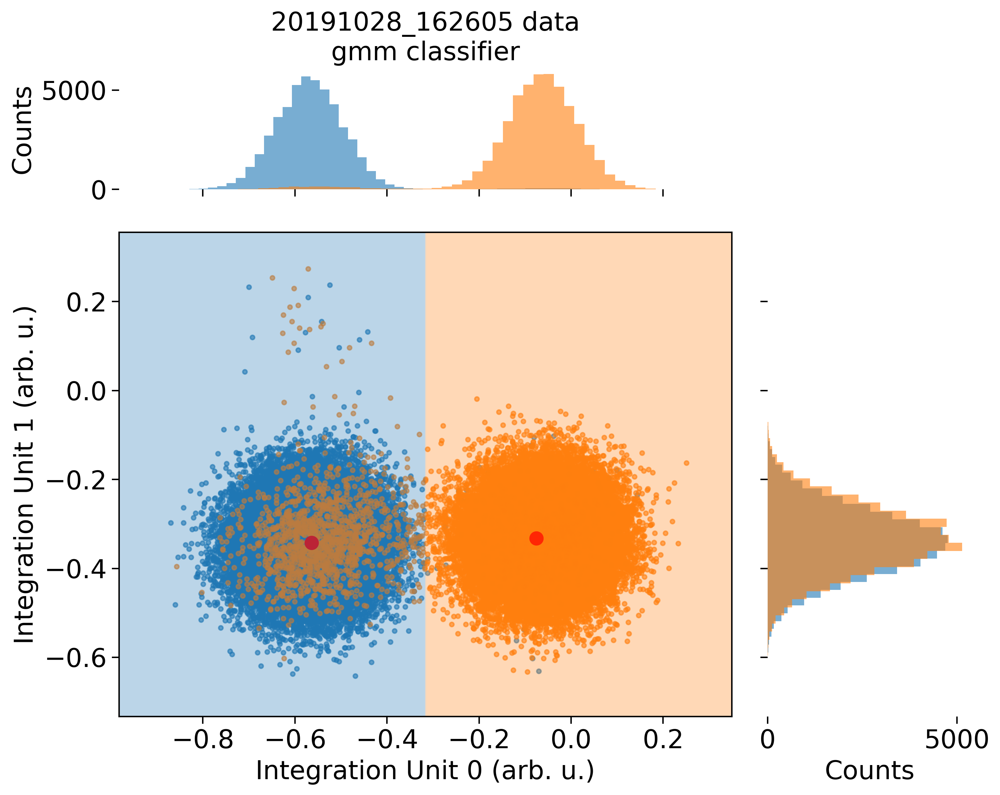

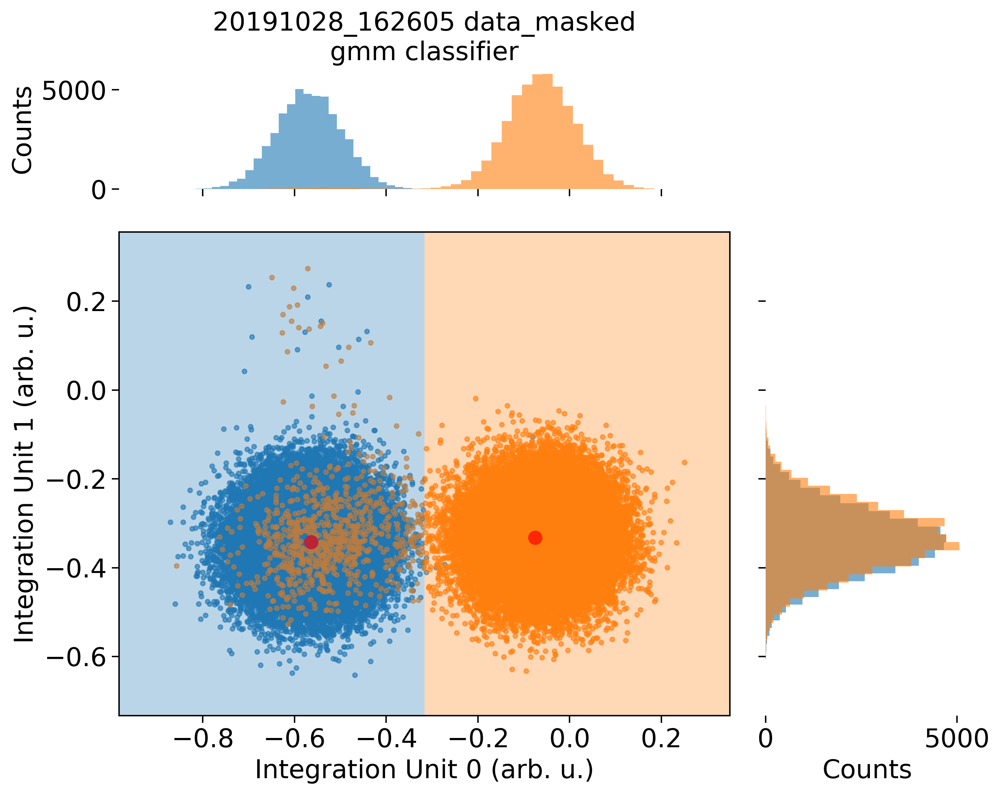

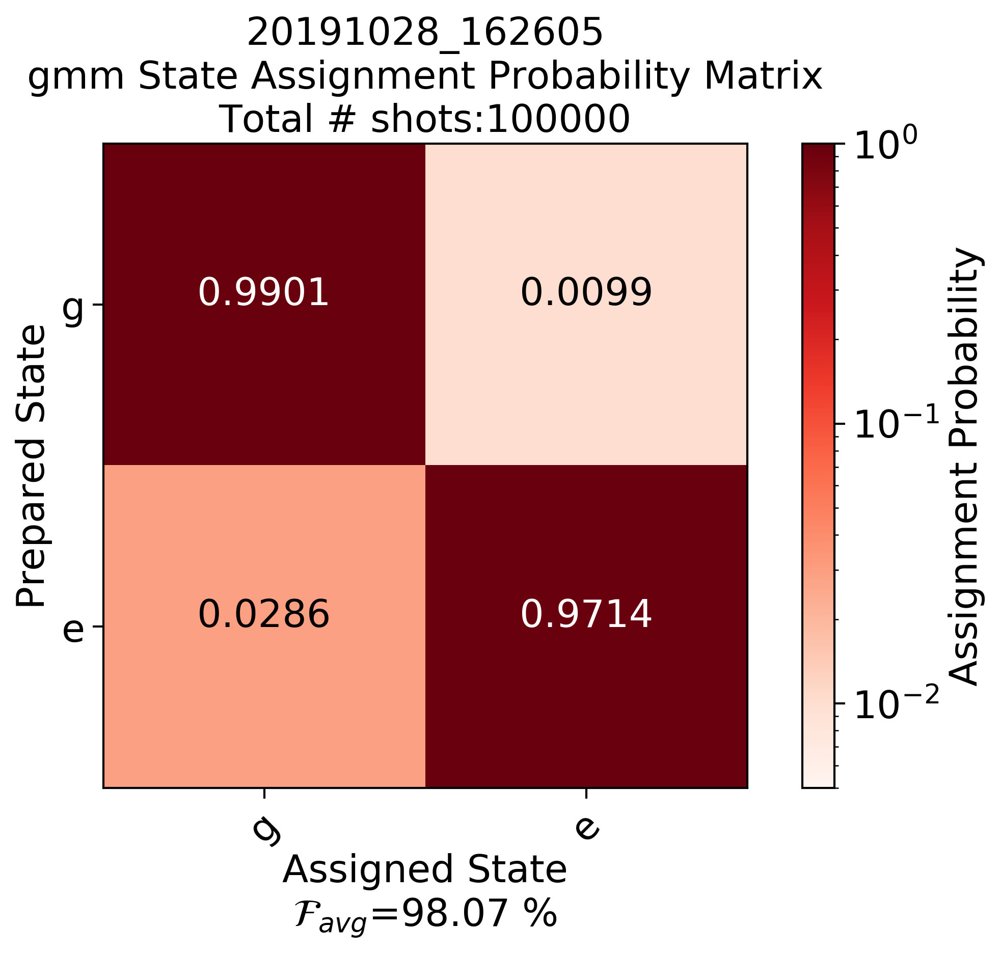

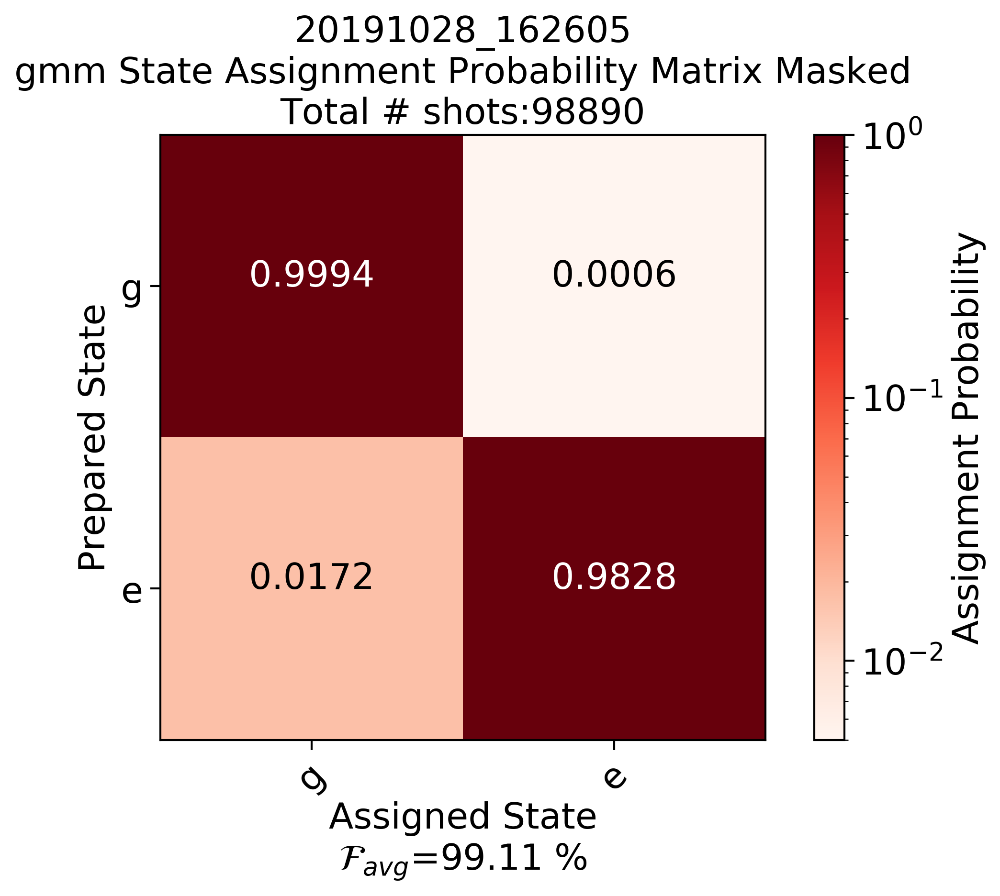

In [270]:
reload(ra)
levels = ['g', 'e']
t_start = ["20191028_162605", "20191028_162623"]

options = dict(pre_selection=True, classif_method='gmm', show=True, classif_kw=dict(), 
               hist_scale="linear")

agmm = ra.Singleshot_Readout_Analysis_Qutrit(
                                               t_start = t_start,
                                               levels=levels,
                                               options_dict=options)


# Rabi EF classified

In [107]:
%matplotlib inline

In [108]:
from pycqed.analysis_v2 import timedomain_analysis as tda
reload(tda)
timestamp = "20191028_164239"
qbn = 'qb1'
channel_map = {qbn: ["UHF_pg w01","UHF_pe w01","UHF_pf w01"]}
options = dict(rotate=False, channel_map=channel_map)
a = tda.RabiAnalysis([qbn], t_start=timestamp, options_dict=options)
ncal = 4 # number of cal points

['20191028_164239']


c:\users\nathan\masterthesis\code\env\lib\site-packages\h5py\_hl\dataset.py:313: H5pyDeprecationWarning:

dataset.value has been deprecated. Use dataset[()] instead.



In [109]:
data_dict = a.proc_data_dict["meas_results_per_qb"][qbn]
sweep_points =  a.proc_data_dict["sweep_points_dict"][qbn]['sweep_points']
probas_raw = np.asarray([data_dict[k] for k in data_dict 
                         for state_prob in ['pg', 'pe', 'pf'] if 
                                             state_prob in k])
probas_corrected = np.linalg.inv(correction_mtx).T @ probas_raw

Text(0, 0.5, 'Population (arb. u.)')

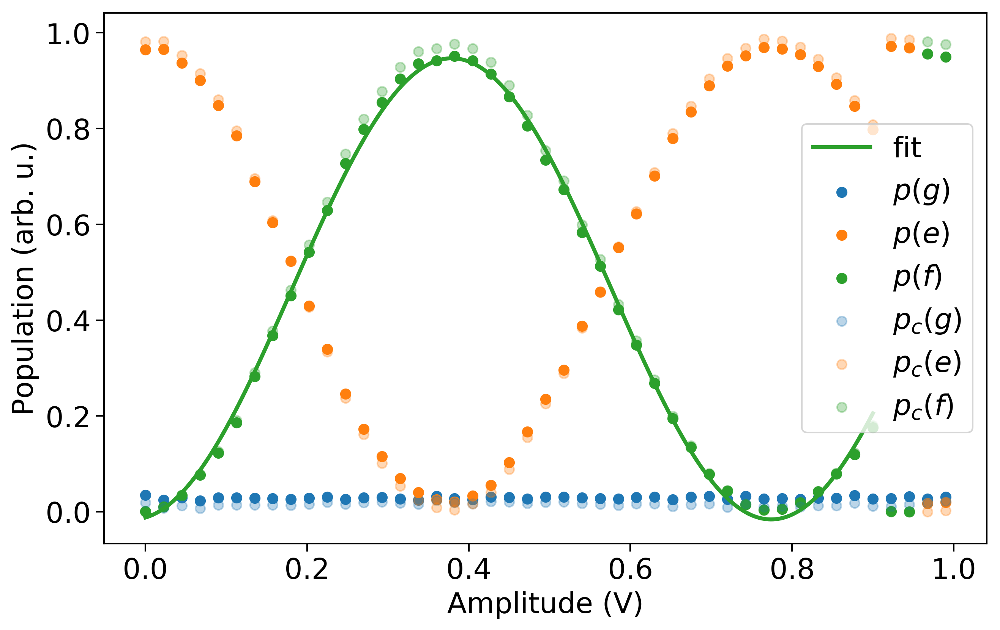

In [130]:
fig, ax = plt.subplots()

colors = ["C0", "C1", "C2"] 
labels = ["$p(g)$", "$p(e)$", "$p(f)$"]
for pr, c, l in zip(probas_raw,colors, labels):
    ax.scatter(sweep_points, pr, color=c, label=l)

labels = ["$p_c(g)$", "$p_c(e)$", "$p_c(f)$"]
alpha = 0.3 
for pc,c,l in zip(probas_corrected,colors, labels):
    ax.scatter(sweep_points, pc, color=c, label=l, alpha=alpha)

# fit
import lmfit
fit = lmfit.Model(lambda t, a, b, c, d: a*np.cos(t/c-b) + d)
# fit.make_params("a_m_d", expr="a-d", min=0)
# fit.make_params("a", min=0)
# fit.make_params("b")
# fit.make_params("c")
# fit.make_params("d")
fit = fit.fit(data=probas_raw[-1][:-ncal], t=sweep_points[:-ncal], a=0.5,d=0.5,c=1, b = 0)
ax.plot(np.linspace(0, sweep_points[-ncal-1],300), fit.eval(t=np.linspace(0, sweep_points[-ncal-1],300), **fit.best_values), color="C2", label="fit")

ax.legend()
ax.set_xlabel("Amplitude (V)")
ax.set_ylabel("Population (arb. u.)")


In [129]:
fit.best_values

{'a': 0.4813022571605869,
 'b': -3.0127825224315554,
 'c': -0.12578626692826894,
 'd': 0.4652939899715604}

# T1 ef

In [49]:
from pycqed.analysis_v2 import timedomain_analysis as tda
timestamp = "20191028_165327"
qbn = 'qb1'
channel_map = {qbn: ["UHF_pg w01","UHF_pe w01","UHF_pf w01"]}
options = dict(rotate=False, channel_map=channel_map)
a = tda.T1Analysis([qbn], t_start=timestamp, options_dict=options)
colors = ['#3673AF','#FF6947', "#39B265"]

import h5py
folder = a_tools.get_folder(timestamp)
h5mode =  'r+'
h5filepath = a_tools.measurement_filename(folder)
data_file = h5py.File(h5filepath, h5mode)

c:\users\nathan\code\quantumsoftware\pycqed_py3\pycqed\measurement\hdf5_data.py:290: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  data_dict[key] = list(item.value)
c:\users\nathan\code\quantumsoftware\pycqed_py3\pycqed\measurement\hdf5_data.py:282: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  data_dict[key] = item.value


In [50]:
correction_mtx = agmm.proc_data_dict['analysis_params']['state_prob_mtx_masked']
correction_mtx

array([[9.98786727e-01, 6.06636604e-04, 6.06636604e-04],
       [1.65950721e-02, 9.83080726e-01, 3.24201653e-04],
       [8.96660851e-03, 1.73651966e-02, 9.73668195e-01]])

In [51]:
data_dict = a.proc_data_dict["meas_results_per_qb"][qbn]
sweep_points =  a.proc_data_dict["sweep_points_dict"][qbn]['sweep_points']
probas_raw = np.asarray([data_dict[k] for k in data_dict 
                         for state_prob in ['pg', 'pe', 'pf'] if 
                                             state_prob in k])
probas_corrected = np.linalg.inv(correction_mtx).T @ probas_raw

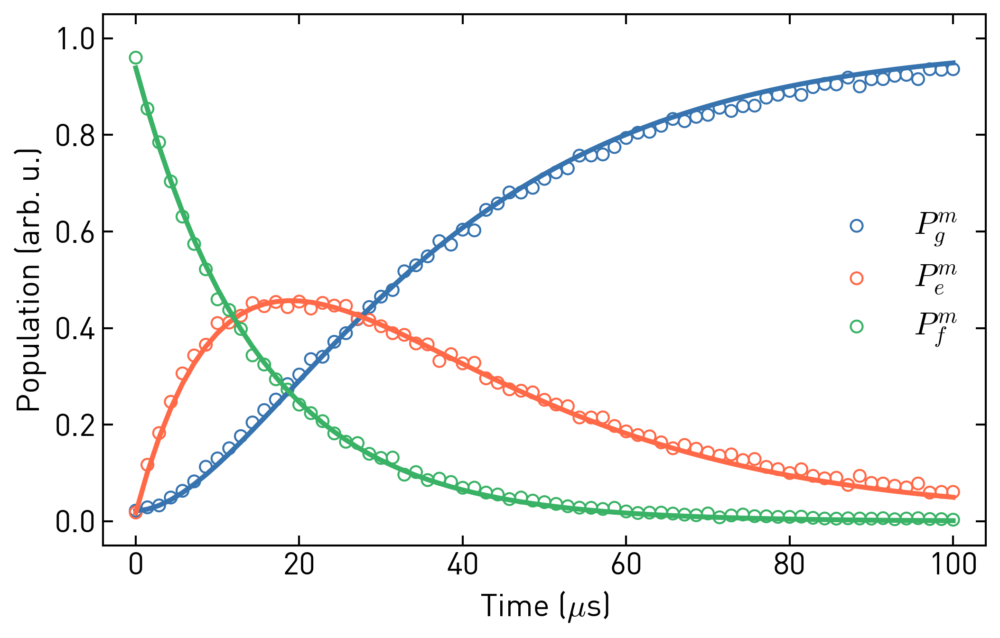

In [69]:
fig, ax = plt.subplots()

# colors = ["C0", "C1", "C2"] 
labels = ["$P_g^m$", "$P_e^m$", "$P_f^m$"]
marker = "o"
for pr, c, l in zip(probas_raw,colors, labels):
    ax.scatter(sweep_points[:-6]*1e6, pr[:-6], color=c, label=l, marker=marker, facecolors='none', alpha=1)
# for pr, c, l in zip(probas_corrected,colors, labels):
#     ax.scatter(sweep_points[:-6]*1e6, pr[:-6], color=c, label=l, marker=marker, facecolors='none')

labels = ["$p_c(g)$", "$p_c(e)$", "$p_c(f)$"]
alpha = 1 
# for pc,c,l in zip(probas_corrected,colors, labels):
#     ax.scatter(sweep_points*1e6, pc, color=c, label=l, alpha=alpha, marker="^",facecolors="None")
ax.legend()
ax.set_xlabel("Time ($\mu$s)")
ax.set_ylabel("Population (arb. u.)")
ax.set_xlim([-4,104])
ax.set_ylim([-0.05,1.05])

plot_fitting = True
alpha = 1
if plot_fitting:


    
    t1_ge = eval(data_file['Instrument settings'][qbn].attrs['T1'])
    t1_ef = a.proc_data_dict["analysis_params_dict"][qbn]["T1"]
    
    sp = sweep_points[:-6]
    # ideal
    # g pop
    pg = (t1_ge * (-np.exp(-sp/t1_ge)) + t1_ge + t1_ef * (np.exp(-sp/t1_ef) - 1))/(t1_ge - t1_ef)
    pe = t1_ge*(np.exp(-sp/t1_ge) - np.exp(-sp/t1_ef))/(t1_ge-t1_ef)
    
    # with non_perfect init state
    b = t1_ge
    c = t1_ef
    g,h,f = agmm.proc_data_dict["analysis_params"]["state_prob_mtx_masked"][2]
#     pg = (np.exp(-t/b - t/c)* (c* f* np.exp(t/b) - b* f *np.exp(t/c) + b *f* np.exp(t/b + t/c) - \
#                                   c *f *np.exp(t/b + t/c) + b *g *np.exp(t/b + t/c) - \
#                                   c* g *np.exp(t/b + t/c) - b *h *np.exp(t/c) + b* h*np.exp(t/b + t/c) -\
#                                   c* h *np.exp(t/b + t/c) + c* h *np.exp(t/c)))/(b - c)
#     pe = (np.exp(-t/b - t/c)* (b* f *np.exp(t/c) + b* h *np.exp(t/c) - b* f *np.exp(t/b) - c *h* np.exp(t/c)))/(b - c)
    
    # with uprate
    t1ge = t1_ge 
    t1ef = t1_ef 
    u = 0.009627 / t1ge # 0.01318 / t1_ge #
    t = sp
    g0,e0,f0 = agmm.proc_data_dict["analysis_params"]["state_prob_mtx"][2]
    pg = (np.exp(t/t1ef)*e0*t1ef -  
        np.exp(t/t1ef + (t*(-t1ef - t1ef*t1ge*u))/(t1ef*t1ge))*e0*t1ef - 
        f0*t1ef + np.exp(t/t1ef)*f0*t1ef + np.exp(t/t1ef)*g0*t1ef - 
        np.exp(t/t1ef)*e0*t1ge + np.exp(t/t1ef + (t*(-t1ef - t1ef*t1ge*u))/(t1ef*t1ge))*e0*t1ge - 
        np.exp(t/t1ef)*f0*t1ge + np.exp(t/t1ef + (t*(-t1ef - 
        t1ef*t1ge*u))/(t1ef*t1ge))*f0*
          t1ge - np.exp(t/t1ef)*g0*t1ge + np.exp(t/t1ef)*e0*t1ef*t1ge*u - np.exp(t/t1ef + (t*(-t1ef - \
        t1ef*t1ge*u))/(t1ef*t1ge))*e0*t1ef*t1ge*u - f0*t1ef*t1ge*u + np.exp(t/t1ef)*f0*t1ef*t1ge*u + \
        np.exp(t/t1ef)*g0*t1ef*t1ge*u +  np.exp(t/t1ef + (t*(-t1ef - 
        t1ef*t1ge*u))/(t1ef*t1ge))*g0*t1ef*t1ge*u - np.exp(t/t1ef + (t*(-t1ef - 
        t1ef*t1ge*u))/(t1ef*t1ge))*g0*t1ge**2*u + np.exp(t/t1ef + (t*(-t1ef - 
        t1ef*t1ge*u))/(t1ef*t1ge))*g0*t1ef*t1ge**2*u**2)/ \
            (np.exp(t/t1ef)*(1 + t1ge*u)*(t1ef - t1ge + t1ef*t1ge*u))
    
    pe = (np.exp(t/t1ef + (t*(-t1ef - t1ef*t1ge*u))/(t1ef*t1ge))*e0*t1ef - 
     np.exp(t/t1ef + (t*(-t1ef - t1ef*t1ge*u))/(t1ef*t1ge))*e0*t1ge + 
    f0*t1ge - np.exp(t/t1ef + (t*(-t1ef - t1ef*t1ge*u))/(t1ef*t1ge))*f0*t1ge + np.exp(t/t1ef)*e0*t1ef*t1ge*u + np.exp(t/t1ef + (t*(-t1ef - \
    t1ef*t1ge*u))/(t1ef*t1ge))*e0*t1ef*t1ge*u - 
         f0*t1ef*t1ge*u + np.exp(t/t1ef)*f0*t1ef*t1ge*u + 
    np.exp(t/t1ef)*g0*t1ef*t1ge*u - 
         np.exp(t/t1ef + (t*(-t1ef - 
    t1ef*t1ge*u))/(t1ef*t1ge))*g0*t1ef*t1ge*u - 
         np.exp(t/t1ef)*e0*t1ge**2*u + f0*t1ge**2*u - 
    np.exp(t/t1ef)*f0*t1ge**2*u - 
         np.exp(t/t1ef)*g0*t1ge**2*u + 
         np.exp(t/t1ef + (t*(-t1ef - 
    t1ef*t1ge*u))/(t1ef*t1ge))*g0*t1ge**2*u + 
         np.exp(t/t1ef)*e0*t1ef*t1ge**2*u**2 - f0*t1ef*t1ge**2*u**2 + 
         np.exp(t/t1ef)*f0*t1ef*t1ge**2*u**2 + 
    np.exp(t/t1ef)*g0*t1ef*t1ge**2*u**2 - 
         np.exp(t/t1ef + (t*(-t1ef - 
    t1ef*t1ge*u))/(t1ef*t1ge))*g0*t1ef*t1ge**2*u**2)/ \
        (np.exp(t/t1ef)*(1 + t1ge*u)*(t1ef - t1ge + t1ef*t1ge*u))
    
    pf = a.fit_res['exp_decay_qb1'].eval(t=sp)
    #plot
    ax.plot(sp*1e6, pg, color=colors[0])
    ax.plot(sp*1e6, pe , color=colors[1])
    ax.plot(sp*1e6, pf, color=colors[2])
    
    

In [70]:
fig.savefig(figsave_base + "\\readout_t1ef_{:%Y%m%d_%H%M%S}.png".format(datetime.datetime.now()), transparent=False)

In [206]:
# evaluate model just at time t
t = np.array([400e-9])
g0,e0,f0 = [0,0,1] #agmm.proc_data_dict["analysis_params"]["state_prob_mtx"][2]
u = 0.0096/ t1ge
pg = (np.exp(t/t1ef)*e0*t1ef -  
    np.exp(t/t1ef + (t*(-t1ef - t1ef*t1ge*u))/(t1ef*t1ge))*e0*t1ef - 
    f0*t1ef + np.exp(t/t1ef)*f0*t1ef + np.exp(t/t1ef)*g0*t1ef - 
    np.exp(t/t1ef)*e0*t1ge + np.exp(t/t1ef + (t*(-t1ef - t1ef*t1ge*u))/(t1ef*t1ge))*e0*t1ge - 
    np.exp(t/t1ef)*f0*t1ge + np.exp(t/t1ef + (t*(-t1ef - 
    t1ef*t1ge*u))/(t1ef*t1ge))*f0*
      t1ge - np.exp(t/t1ef)*g0*t1ge + np.exp(t/t1ef)*e0*t1ef*t1ge*u - np.exp(t/t1ef + (t*(-t1ef - \
    t1ef*t1ge*u))/(t1ef*t1ge))*e0*t1ef*t1ge*u - f0*t1ef*t1ge*u + np.exp(t/t1ef)*f0*t1ef*t1ge*u + \
    np.exp(t/t1ef)*g0*t1ef*t1ge*u +  np.exp(t/t1ef + (t*(-t1ef - 
    t1ef*t1ge*u))/(t1ef*t1ge))*g0*t1ef*t1ge*u - np.exp(t/t1ef + (t*(-t1ef - 
    t1ef*t1ge*u))/(t1ef*t1ge))*g0*t1ge**2*u + np.exp(t/t1ef + (t*(-t1ef - 
    t1ef*t1ge*u))/(t1ef*t1ge))*g0*t1ef*t1ge**2*u**2)/ \
        (np.exp(t/t1ef)*(1 + t1ge*u)*(t1ef - t1ge + t1ef*t1ge*u))

pe = (np.exp(t/t1ef + (t*(-t1ef - t1ef*t1ge*u))/(t1ef*t1ge))*e0*t1ef - 
 np.exp(t/t1ef + (t*(-t1ef - t1ef*t1ge*u))/(t1ef*t1ge))*e0*t1ge + 
f0*t1ge - np.exp(t/t1ef + (t*(-t1ef - t1ef*t1ge*u))/(t1ef*t1ge))*f0*t1ge + np.exp(t/t1ef)*e0*t1ef*t1ge*u + np.exp(t/t1ef + (t*(-t1ef - \
t1ef*t1ge*u))/(t1ef*t1ge))*e0*t1ef*t1ge*u - 
     f0*t1ef*t1ge*u + np.exp(t/t1ef)*f0*t1ef*t1ge*u + 
np.exp(t/t1ef)*g0*t1ef*t1ge*u - 
     np.exp(t/t1ef + (t*(-t1ef - 
t1ef*t1ge*u))/(t1ef*t1ge))*g0*t1ef*t1ge*u - 
     np.exp(t/t1ef)*e0*t1ge**2*u + f0*t1ge**2*u - 
np.exp(t/t1ef)*f0*t1ge**2*u - 
     np.exp(t/t1ef)*g0*t1ge**2*u + 
     np.exp(t/t1ef + (t*(-t1ef - 
t1ef*t1ge*u))/(t1ef*t1ge))*g0*t1ge**2*u + 
     np.exp(t/t1ef)*e0*t1ef*t1ge**2*u**2 - f0*t1ef*t1ge**2*u**2 + 
     np.exp(t/t1ef)*f0*t1ef*t1ge**2*u**2 + 
np.exp(t/t1ef)*g0*t1ef*t1ge**2*u**2 - 
     np.exp(t/t1ef + (t*(-t1ef - 
t1ef*t1ge*u))/(t1ef*t1ge))*g0*t1ef*t1ge**2*u**2)/ \
    (np.exp(t/t1ef)*(1 + t1ge*u)*(t1ef - t1ge + t1ef*t1ge*u))

pf = np.exp(-1/t1ef*t)
print(pg + pe + pf)
print(pg, pe, pf)

[1.]
[0.00020988] [0.02616633] [0.97362379]
